# BOM: HYCOM1 versus Z* 

Gustavo Marques (gmarques@ucar.edu)

In [1]:
from datetime import date
print("Last update:", date.today())

Last update: 2022-03-17


## Summary  

* **Z02_65L**: bmom.e23.f09_t061_zstar_N65.nuopc.enthalpy_via_cpl.002; run for 100 years; BMOM Z* (N=65) update_ocn_f = .true. + and a limit on the salt flux from ice formation was imposed in CICE5 (this includes the creation of sea ice from snow).
* **H01_75_L**: bmom.e23.f09_t061_hycom1_N75.nuopc.enthalpy_via_cpl.001; run for 100 years; BMOM hycom1 (N=75) update_ocn_f = .true. + and a limit on the salt flux from ice formation was imposed in CICE5 (this includes the creation of sea ice from snow). 

Ice diagnostics: 
Atm diagnostics: 

In [2]:
from IPython.display import Image, HTML, display
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import warnings, os, glob
from mom6_tools.MOM6grid import MOM6grid
from mom6_tools.m6toolbox import genBasinMasks
from mom6_tools.m6plot import ztplot, xyplot, yzplot, chooseColorLevels
import pop_tools
warnings.filterwarnings("ignore")
matplotlib.rcParams.update({'font.size': 14})
%matplotlib inline

Basemap module not found. Some regional plots may not function properly


In [3]:
path = '/glade/scratch/gmarques/'
exps = ['bmom.e23.f09_t061_zstar_N65.nuopc.enthalpy_via_cpl.002',\
        'bmom.e23.f09_t061_hycom1_N75.nuopc.enthalpy_via_cpl.001']

labels = ['Z02_65L','H01_75L']
#labels = ['Z01_65L','H01_75L']

# set this to true to save the plots
saveplot = False
if saveplot:
    os.system('mkdir PNG')

In [4]:
def get_data(full_path, variables):
  def preprocess(ds):
    ''' Return the dataset with variable'''
    return ds[variables]
  ds = xr.open_mfdataset(full_path, data_vars='minimal', \
                         coords='minimal', compat='override', preprocess=preprocess)
  return ds

In [5]:
# load grid and pre-difined masks
grd = MOM6grid(path+exps[0]+'/run/'+exps[0]+'.mom6.static.nc')
grd_xr = MOM6grid(path+exps[0]+'/run/'+exps[0]+'.mom6.static.nc', xrformat=True)
depth = grd.depth_ocean
# remote Nan's, otherwise genBasinMasks won't work
depth[np.isnan(depth)] = 0.0
basin_code = genBasinMasks(grd.geolon, grd.geolat, depth, xda=True)

MOM6 grid successfully loaded... 

MOM6 grid successfully loaded... 

11.16428 64.78855 [391, 434]


## Globally-averaged ocean properties

../../bmom.e23.f09_t061_zstar_N65.nuopc.enthalpy_via_cpl.002/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.enthalpy_via_cpl.002_mon_ave_global_means.nc
../../bmom.e23.f09_t061_hycom1_N75.nuopc.enthalpy_via_cpl.001/ncfiles/bmom.e23.f09_t061_hycom1_N75.nuopc.enthalpy_via_cpl.001_mon_ave_global_means.nc


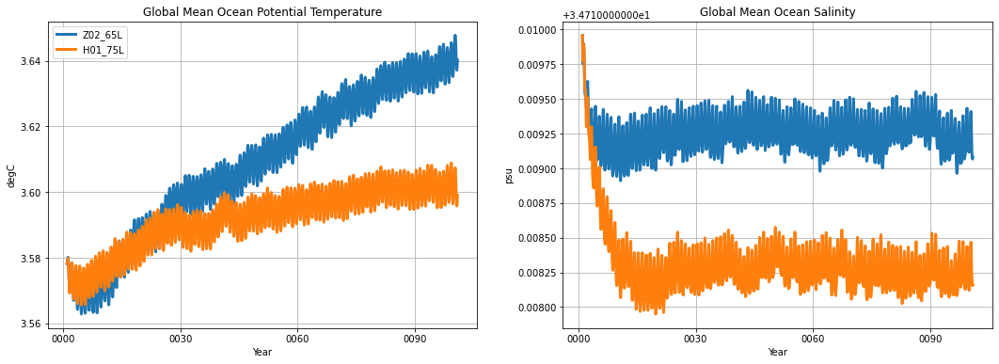

In [6]:
%matplotlib inline
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,6))
variables = ['thetaoga', 'soga']
for i in range(len(exps)):
  tmp = '../../'+exps[i]+'/ncfiles/'+exps[i]+'_mon_ave_global_means.nc'
  print(tmp)
  ds = get_data(tmp,variables)
  ds['thetaoga'].plot(ax=ax[0], label=labels[i], lw=3)
  ds['soga'].plot(ax=ax[1], lw=3)

ax[0].set_title(ds.thetaoga.attrs['long_name']); ax[0].set_ylabel(ds.thetaoga.attrs['units'])
ax[1].set_title(ds.soga.attrs['long_name']); ax[1].set_ylabel(ds.soga.attrs['units'])
ax[0].legend()
ax[0].set_xlabel('Year')
ax[1].set_xlabel('Year')
ax[0].grid(); ax[1].grid()
if saveplot:
    fname = 'PNG/global_means.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

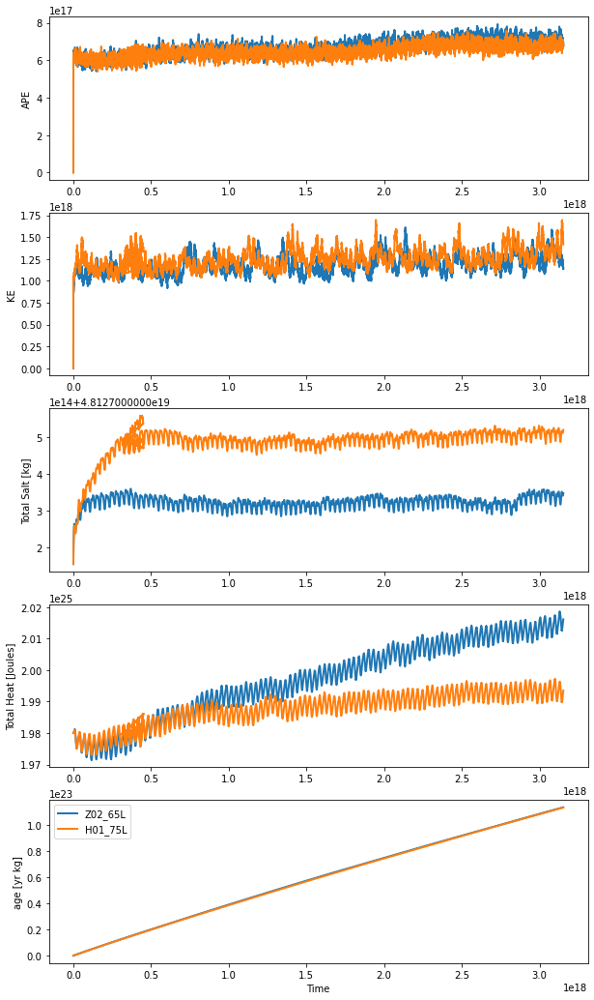

In [7]:
%matplotlib inline
variables = ['APE', 'KE', 'Salt', 'Heat', 'age']
fig, ax = plt.subplots(nrows=len(variables), ncols=1, figsize=(10,18))
for i in range(len(exps)): 
  ds = xr.open_dataset(path+exps[i]+'/run/ocean.stats.nc')
  #ds = ds.isel(Time=range(1000, 21172))
  for var, j in zip(variables, range(len(variables))):
    if len(ds[var].shape) > 1:
        tmp = ds[var].sum(axis=1)
    else:
        tmp = ds[var]
    tmp.plot(ax=ax[j], label=labels[i], lw=2)
    ax[j].set_xlabel('')
    
ax[j].set_xlabel('Time'); ax[j].legend()
if saveplot:
    fname = 'PNG/ocean_stats.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

## Mixed layer depth

In [8]:
filepath = '/glade/work/gmarques/cesm/datasets/MLD/deBoyer/deBoyer_MLD_remapped_to_tx06v1.nc'
print('\n Reading climatology from: ', filepath)
mld_obs = xr.open_dataset(filepath)
months = [0,1,2]
obs_JFM = np.ma.masked_invalid(mld_obs.mld.isel(time=months).mean('time').values)
months = [6,7,8]
obs_JAS = np.ma.masked_invalid(mld_obs.mld.isel(time=months).mean('time').values)
obs_winter = obs_JAS.copy(); obs_summer = obs_JAS.copy()
j = np.abs( grd.geolat[:,0] - 0. ).argmin()
obs_winter[j::,:] = obs_JFM[j::,:]
obs_summer[0:j,:] = obs_JFM[0:j,:]

bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9)
def add_labels(ax, nh='JFM', sh='JAS'):
    ax.plot([grd.geolon[0,0], grd.geolon[0,-1]], [0,0], 'k--', lw=0.5)
    ax.text(25, 7, nh, ha="center", va="center", size=12, bbox=bbox_props)
    ax.text(25, -7, sh, ha="center", va="center", size=12, bbox=bbox_props)


 Reading climatology from:  /glade/work/gmarques/cesm/datasets/MLD/deBoyer/deBoyer_MLD_remapped_to_tx06v1.nc


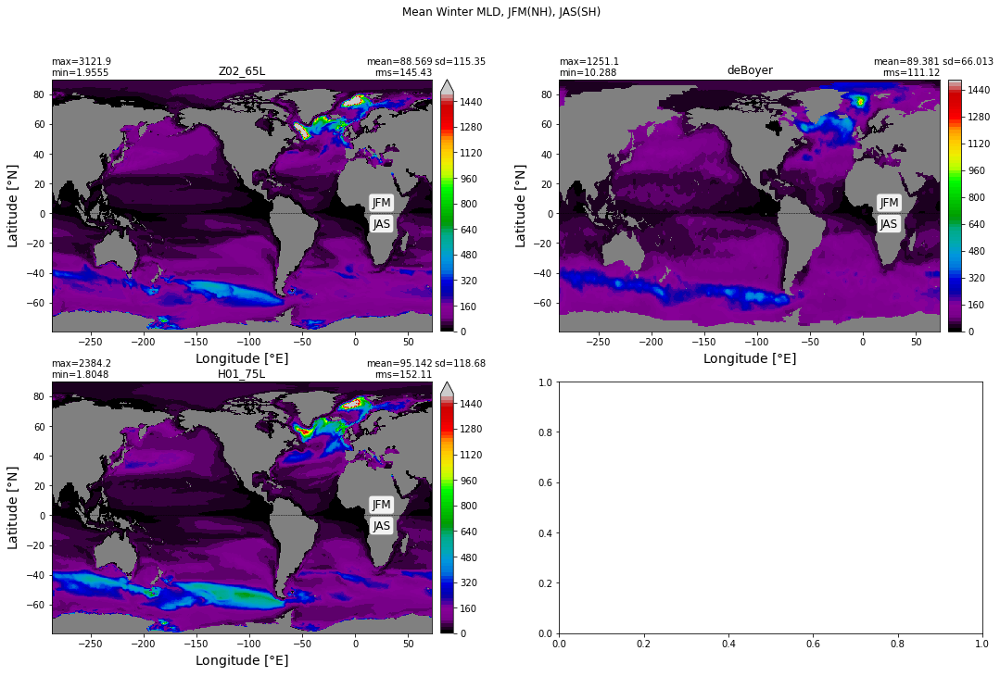

In [9]:
%matplotlib inline
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(18,11))
ax1 = ax.flatten()
plt.suptitle('Mean Winter MLD, JFM(NH), JAS(SH)')
for i in range(len(exps)):
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MLD_winter.nc')
  if i == 0:
   control = np.ma.masked_invalid(ds.MLD_winter.values)
   xyplot(control, grd.geolon, grd.geolat, grd.area_t, title=str(labels[i]), axis=ax1[i], clim=(0,1500), nbins=100,
         colormap=plt.cm.nipy_spectral); add_labels(ax1[i])
  else:
   var = np.ma.masked_invalid(ds.MLD_winter.values) 
   xyplot(var, grd.geolon, grd.geolat, grd.area_t, title=str(labels[i]), axis=ax1[i+1], clim=(0,1500),
         colormap=plt.cm.nipy_spectral, nbins=100); add_labels(ax1[i+1])


xyplot(obs_winter, grd.geolon, grd.geolat, grd.area_t, title='deBoyer', axis=ax1[1], clim=(0,1500), nbins=100,
       colormap=plt.cm.nipy_spectral); add_labels(ax1[1])

#diff = var - control
#xyplot(diff, grd.geolon, grd.geolat, grd.area_t, title=str(labels[1]+' - '+labels[0]), axis=ax1[3], 
#       colormap=plt.cm.bwr, nbins=20); add_labels(ax1[3])

if saveplot:
    fname = 'PNG/MLD_winter.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

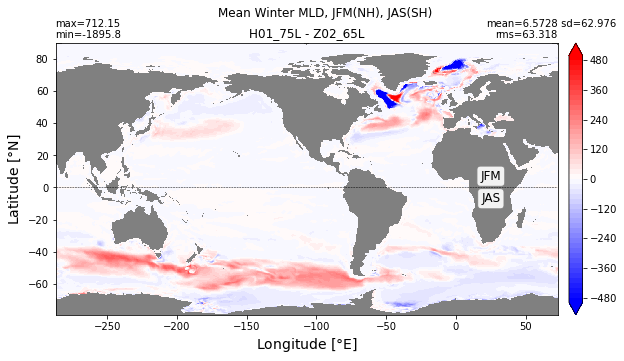

In [10]:
%matplotlib inline
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))

plt.suptitle('Mean Winter MLD, JFM(NH), JAS(SH)')
ds = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_MLD_winter.nc')
control = np.ma.masked_invalid(ds.MLD_winter.values)
for i in [1]:
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MLD_winter.nc')
  var = np.ma.masked_invalid(ds.MLD_winter.values) -control
  xyplot(var, grd.geolon, grd.geolat, grd.area_t, title=labels[i]+ ' - ' + labels[0], 
         axis=ax, clim=(-500,500),
         colormap=plt.cm.bwr, nbins=50); add_labels(ax)

if saveplot:
    fname = 'PNG/MLD_winter_comparison.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

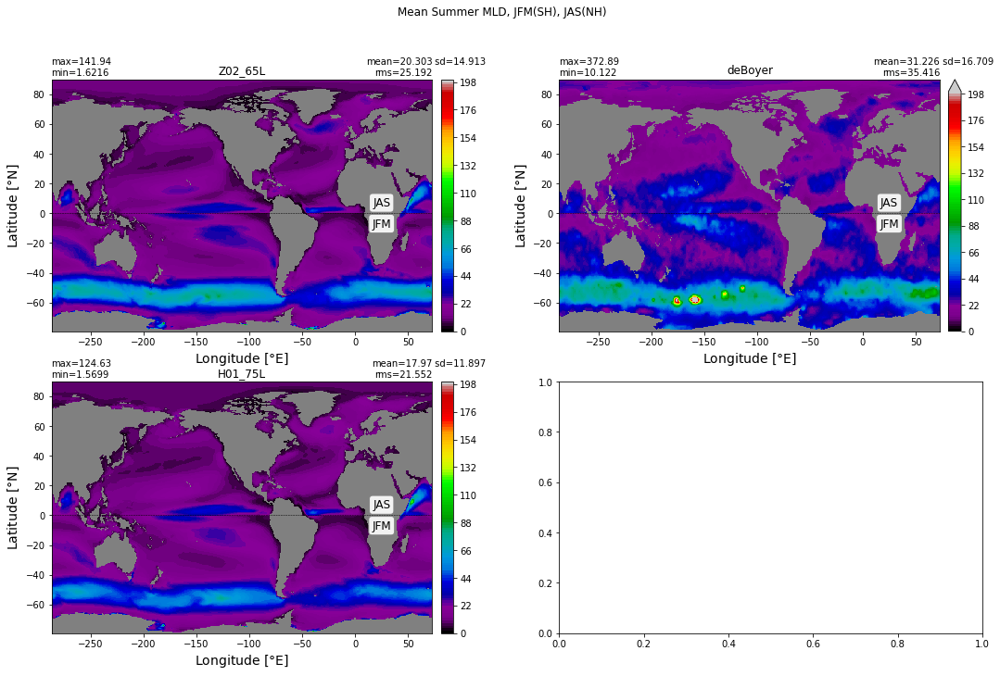

In [11]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(18,11))
ax1 = ax.flatten()
plt.suptitle('Mean Summer MLD, JFM(SH), JAS(NH)')
for i in range(len(exps)):
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MLD_summer.nc')
  if i == 0:
   control = np.ma.masked_invalid(ds.MLD_summer.values)
   xyplot(control, grd.geolon, grd.geolat, grd.area_t, title=str(labels[i]), axis=ax1[i], clim=(0,200), nbins=100,
         colormap=plt.cm.nipy_spectral); add_labels(ax1[i], sh='JFM', nh='JAS')
  else:
   var = np.ma.masked_invalid(ds.MLD_summer.values) 
   xyplot(var, grd.geolon, grd.geolat, grd.area_t, title=str(labels[i]), axis=ax1[i+1], clim=(0,200), nbins=100,
         colormap=plt.cm.nipy_spectral); add_labels(ax1[i+1], sh='JFM', nh='JAS')

xyplot(obs_summer, grd.geolon, grd.geolat, grd.area_t, title='deBoyer', axis=ax1[1], clim=(0,200), nbins=100,
       colormap=plt.cm.nipy_spectral); add_labels(ax1[1], sh='JFM', nh='JAS')

#diff = var - control
#xyplot(diff, grd.geolon, grd.geolat, grd.area_t, title=str(labels[1]+' - '+labels[0]), axis=ax1[3], 
#       colormap=plt.cm.bwr, nbins=20); add_labels(ax1[3], sh='JFM', nh='JAS')

if saveplot:
    fname = 'PNG/MLD_summer.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

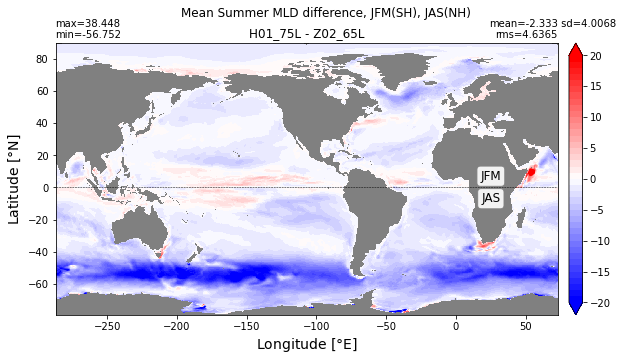

In [12]:
%matplotlib inline
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))
plt.suptitle('Mean Summer MLD difference, JFM(SH), JAS(NH)')
ds = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_MLD_summer.nc')
control = np.ma.masked_invalid(ds.MLD_summer.values)
for i in [1]:
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MLD_summer.nc')
  var = np.ma.masked_invalid(ds.MLD_summer.values) -control
  xyplot(var, grd.geolon, grd.geolat, grd.area_t, title=labels[i]+ ' - ' + labels[0], axis=ax, 
         clim=(-20,20),
         colormap=plt.cm.bwr, nbins=50); add_labels(ax)

if saveplot:
    fname = 'PNG/MLD_summer_comparison.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

## Mean SSH bias

In [6]:
from distributed import Client
from ncar_jobqueue import NCARCluster

cluster = NCARCluster()
cluster.scale(12)
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/gmarques/high_memory/proxy/40368/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/gmarques/high_memory/proxy/40368/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.37:43554,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/gmarques/high_memory/proxy/40368/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [6]:
# load WOA18 data for MOM6
aviso_path = '/glade/work/gmarques/cesm/datasets/Aviso/'
ssh_aviso = xr.open_dataset(aviso_path+'mean_ssh_yearly_climatology_remaped_to_tx0.6v1.nc')

ssh_aviso = ssh_aviso.assign_coords({"geolon": (("latitude","longitude"), grd.geolon)})
ssh_aviso = ssh_aviso.assign_coords({"geolat": (("latitude","longitude"), grd.geolat)})
ssh_aviso['longitude'] = grd.xh; ssh_aviso['latitude'] = grd.yh

In [12]:
start = '0070-01-01'
end = '0099-12-31'
def preprocess(ds):
  ''' Compute montly averages and return the dataset with variables'''
  variables=['SSH']
  return ds[variables].sel(time=slice(start, end))

ssh = []
for i in range(len(exps)):
  files = sorted(glob.glob(path+exps[i]+'/run/'+exps[i]+'.mom6.hm_*.nc'))[0:-1]

  ds = xr.open_mfdataset(files,
        parallel=True,
        concat_dim="time",
        combine="nested",
        preprocess=preprocess,
        chunks={'time': 1},)
    
  ssh.append(ds.SSH.mean(dim='time'))

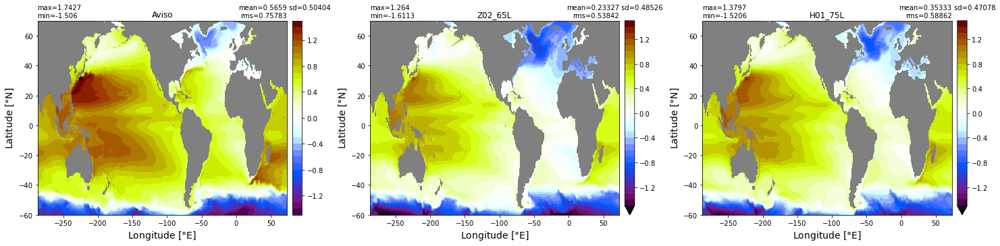

In [13]:
%matplotlib inline

area = grd_xr.area_t.sel(yh=slice(-60,70)).values
geolat = grd_xr.geolat.sel(yh=slice(-60,70)).values
geolon = grd_xr.geolon.sel(yh=slice(-60,70)).values

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(25,5.3))
ax1 = ax.flatten()

ssh_mom1 = np.ma.masked_invalid(ssh[0].sel(yh=slice(-60,70)).values)
ssh_mom2 = np.ma.masked_invalid(ssh[1].sel(yh=slice(-60,70)).values)
aviso = np.ma.masked_invalid(ssh_aviso['adt'].sel(latitude=slice(-60,70)).values)
xyplot(aviso, geolon, geolat, area, 
         title='Aviso', axis=ax1[0], extend='neither',
         clim=(-1.5,1.5), nbins=30, centerlabels=True)

xyplot(ssh_mom1, geolon, geolat, area, 
         title=str(labels[0]), axis=ax1[1], 
         clim=(-1.5,1.5), nbins=30, centerlabels=True)

xyplot(ssh_mom2, geolon, geolat, area, 
         title=str(labels[1]), axis=ax1[2], 
         clim=(-1.5,1.5), nbins=30, centerlabels=True)

##  Poleward Heat Transport

In [13]:
def get_heat_transport_obs():
  import netCDF4
  """Plots model vs obs poleward heat transport for the global, Pacific and Atlantic basins"""
  # Load Observations
  fObs = netCDF4.Dataset('/glade/work/gmarques/cesm/datasets/Trenberth_and_Caron_Heat_Transport.nc')
  #Trenberth and Caron
  yobs = fObs.variables['ylat'][:]
  NCEP = {}; NCEP['Global'] = fObs.variables['OTn']
  NCEP['Atlantic'] = fObs.variables['ATLn'][:]; NCEP['IndoPac'] = fObs.variables['INDPACn'][:]
  ECMWF = {}; ECMWF['Global'] = fObs.variables['OTe'][:]
  ECMWF['Atlantic'] = fObs.variables['ATLe'][:]; ECMWF['IndoPac'] = fObs.variables['INDPACe'][:]

  #G and W
  Global = {}
  Global['lat'] = np.array([-30., -19., 24., 47.])
  Global['trans'] = np.array([-0.6, -0.8, 1.8, 0.6])
  Global['err'] = np.array([0.3, 0.6, 0.3, 0.1])

  Atlantic = {}
  Atlantic['lat'] = np.array([-45., -30., -19., -11., -4.5, 7.5, 24., 47.])
  Atlantic['trans'] = np.array([0.66, 0.35, 0.77, 0.9, 1., 1.26, 1.27, 0.6])
  Atlantic['err'] = np.array([0.12, 0.15, 0.2, 0.4, 0.55, 0.31, 0.15, 0.09])

  IndoPac = {}
  IndoPac['lat'] = np.array([-30., -18., 24., 47.])
  IndoPac['trans'] = np.array([-0.9, -1.6, 0.52, 0.])
  IndoPac['err'] = np.array([0.3, 0.6, 0.2, 0.05,])

  GandW = {}
  GandW['Global'] = Global
  GandW['Atlantic'] = Atlantic
  GandW['IndoPac'] = IndoPac
  return NCEP, ECMWF, GandW, yobs

NCEP, ECMWF, GandW, yobs = get_heat_transport_obs()
from mom6_tools.poleward_heat_transport import annotateObs, plotGandW, plotHeatTrans, heatTrans

In [14]:
def get_adv_diff(ds):
  # create a ndarray subclass
  class C(np.ndarray): pass

  varName = 'T_ady_2d'
  if varName in ds.variables:
    tmp = np.ma.masked_invalid(ds[varName].values)
    tmp = tmp[:].filled(0.)
    advective = tmp.view(C)
    advective.units = 'W'
  else:
    raise Exception('Could not find "T_ady_2d"')

  varName = 'T_diffy_2d'
  if varName in ds.variables:
    tmp = np.ma.masked_invalid(ds[varName].values)
    tmp = tmp[:].filled(0.)
    diffusive = tmp.view(C)
    diffusive.units = 'W'
  else:
    diffusive = None
    warnings.warn('Diffusive temperature term not found. This will result in an underestimation of the heat transport.')

  varName = 'T_lbm_diffy'
  if varName in ds.variables:
    tmp = np.ma.masked_invalid(ds_sel[varName].sum('z_l').values)
    tmp = tmp[:].filled(0.)
    diffusive = diffusive + tmp.view(C)
  else:
    warnings.warn('Lateral boundary mixing term not found. This will result in an underestimation of the heat transport.')
    
  return advective, diffusive

<center> <font size="4">Global Heat Transport</font>

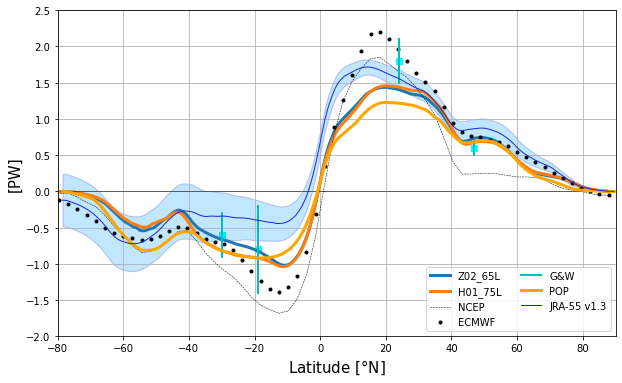

In [15]:
# Global Heat Transport
plt.figure(figsize=(10,6))
for i in range(len(exps)):
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_heat_transport.nc')
  adv, diff = get_adv_diff(ds)
  HT = heatTrans(adv,diff); y = ds.yq
  plt.plot(y, HT, linewidth=3,label=labels[i]); 
    
plt.xlim(-80,90); plt.ylim(-2.5,3.0); plt.grid(True); 
plt.plot(y, y*0., 'k', linewidth=0.5)
plt.plot(yobs,NCEP['Global'],'k--',linewidth=0.5,label='NCEP'); 
plt.plot(yobs,ECMWF['Global'],'k.',linewidth=0.5,label='ECMWF')
plotGandW(GandW['Global']['lat'],GandW['Global']['trans'],GandW['Global']['err'])
pop = xr.open_dataset('/glade/u/home/bryan/MOM6-modeloutputanalysis/MHT_mean.g210.GIAF_JRA.v13.gx1v7.01.nc')
jra = xr.open_dataset('/glade/work/gmarques/cesm/datasets/Heat_transport/jra55fcst_v1_3_annual_1x1/nht_jra55do_v1_3.nc')
plt.plot(pop.lat_aux_grid.values,pop.MHT_global.values,'orange',linewidth=3,label='POP')
jra_mean_global = jra.nht[:,0,:].mean('time').values
jra_std_global = jra.nht[:,0,:].std('time').values
plt.plot(jra.lat, jra_mean_global,'k', label='JRA-55 v1.3', color='#1B2ACC', lw=1)
plt.fill_between(jra.lat, jra_mean_global-jra_std_global, jra_mean_global+jra_std_global,
    alpha=0.25, edgecolor='#1B2ACC', facecolor='#089FFF')

plt.xlabel(r'Latitude [$\degree$N]',fontsize=15)
plt.ylabel('[PW]',fontsize=15)
plt.legend(loc=4,fontsize=10, ncol=2)
plt.ylim(-2.,2.5)
if saveplot:
    fname = 'PNG/global_poleward_heat_transport.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

In [16]:
basin_code = genBasinMasks(grd.geolon, grd.geolat, depth)

11.16428 64.78855 [391, 434]


<center> <font size="4">Atlantic Heat Transport</font>

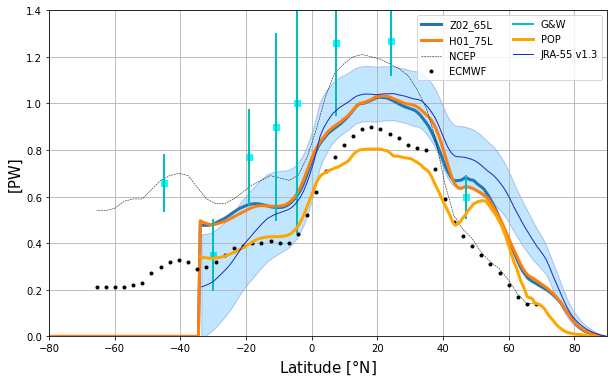

In [17]:
# Atlantic Heat Transport
m = 0*basin_code; m[(basin_code==2) | (basin_code==4) | (basin_code==6) | (basin_code==7) | (basin_code==8)] = 1
plt.figure(figsize=(10,6))
for i in range(len(exps)):
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_heat_transport.nc')
  adv, diff = get_adv_diff(ds)
  HT = heatTrans(adv,diff, vmask=m*np.roll(m,-1,axis=-2)); y = ds.yq
  plt.plot(y, HT, linewidth=3,label=labels[i])
    
plt.xlim(-80,90); plt.ylim(-0.1,2.0)
plt.grid(True); plt.plot(y, y*0., 'k', linewidth=0.5)
plt.plot(yobs,NCEP['Atlantic'],'k--',linewidth=0.5,label='NCEP'); 
plt.plot(yobs,ECMWF['Atlantic'],'k.',linewidth=0.5,label='ECMWF'); 
plotGandW(GandW['Atlantic']['lat'],GandW['Atlantic']['trans'],GandW['Atlantic']['err'])

plt.plot(pop.lat_aux_grid.values,pop.MHT_atl.values,'orange',linewidth=3,label='POP')
jra_mean_atl = jra.nht[:,1,:].mean('time').values
jra_std_atl = jra.nht[:,1,:].std('time').values
plt.plot(jra.lat, jra_mean_atl,'k', label='JRA-55 v1.3', color='#1B2ACC', lw=1)
plt.fill_between(jra.lat, jra_mean_atl-jra_std_atl, jra_mean_atl+jra_std_atl,
    alpha=0.25, edgecolor='#1B2ACC', facecolor='#089FFF')

plt.xlabel(r'Latitude [$\degree$N]',fontsize=15)
plt.ylabel('[PW]',fontsize=15); plt.legend(loc=0,fontsize=10, ncol=2)
plt.ylim(0,1.4)
if saveplot:
    fname = 'PNG/atlantic_poleward_heat_transport.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

## Meridional Overturning Circulation

### Global

In [18]:
thislist = []
for i in range(len(exps)):
  thislist.append('../../'+exps[i]+'/PNG/MOC/'+exps[i]+'_MOC_global.png')

dummy = "<img style='width: 650px; margin: 1px; float: left; border: 0px solid black;' src='%s' />"
imagesList=''.join( [dummy % str(s) 
                     for s in thislist ])
display(HTML(imagesList))

### AMOC

In [19]:
thislist = []
for i in range(len(exps)):
  thislist.append('../../'+exps[i]+'/PNG/MOC/'+exps[i]+'_MOC_Atlantic.png')

dummy = "<img style='width: 650px; margin: 1px; float: left; border: 0px solid black;' src='%s' />"
imagesList=''.join( [dummy % str(s) 
                     for s in thislist ])
display(HTML(imagesList))

### AMOC time series @ 26N and 45N

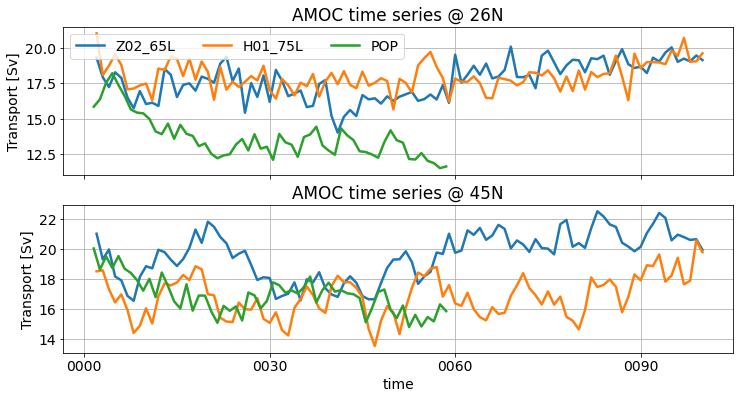

In [20]:
matplotlib.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12,6), sharex=True)
for i in range(len(exps)):
  ds1 = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MOC.nc')
  ds1.amoc_26.plot(ax=ax[0], label=labels[i], lw=2.5)
  ds2 = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MOC.nc')
  ds2.amoc_45.plot(ax=ax[1], label=labels[i], lw=2.5)


# load AMOC from POP JRA-55
amoc_pop_26 = xr.open_dataset('/glade/u/home/bryan/MOM6-modeloutputanalysis/'
            'AMOC_series_26n.g210.GIAF_JRA.v13.gx1v7.01.nc').sel(time=slice('0001-01-01', '0059-01-01'))
amoc_pop_26.AMOC_26n.plot(ax=ax[0], label='POP', lw=2.5)

amoc_pop_45 = xr.open_dataset('/glade/u/home/bryan/MOM6-modeloutputanalysis/'
            'AMOC_series_45n.g210.GIAF_JRA.v13.gx1v7.01.nc').sel(time=slice('0001-01-01', '0059-01-01'))
amoc_pop_45.AMOC_45n.plot(ax=ax[1], label='POP', lw=2.5)


ax[0].set_ylabel('Transport [Sv]'); ax[0].legend(ncol=5); ax[0].set_title('AMOC time series @ 26N')
ax[0].set_xlabel('');ax[0].grid()
ax[1].set_ylabel('Transport [Sv]'); ax[1].set_title('AMOC time series @ 45N');ax[1].grid()

if saveplot:
    fname = 'PNG/AMOC_time_series.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

### AMOC Profile @ 26N

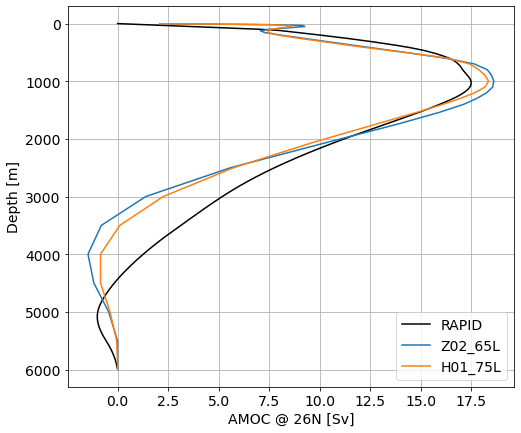

In [21]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,7))
rapid_vertical = xr.open_dataset('/glade/work/gmarques/cesm/datasets/RAPID/moc_vertical.nc')
ax.plot(rapid_vertical.stream_function_mar.mean('time'), rapid_vertical.depth, 'k', label='RAPID')
for i in range(len(exps)):
  ds1 = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_MOC.nc')
  ax.plot(ds1['amoc'].sel(yq=26, method='nearest'), ds1.zl, label=labels[i])
  #
  #plt.grid()
  
ax.set_xlabel('AMOC @ 26N [Sv]')
ax.set_ylabel('Depth [m]')
ax.legend()
ax.grid()
plt.gca().invert_yaxis()

## Transports
Transects are shown at the end of [this](https://gist.github.com/gustavo-marques/bd6e9bb43062dcbc2abda91b757c7c4b) notebook.

In [22]:
ds = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_section_transports.nc')

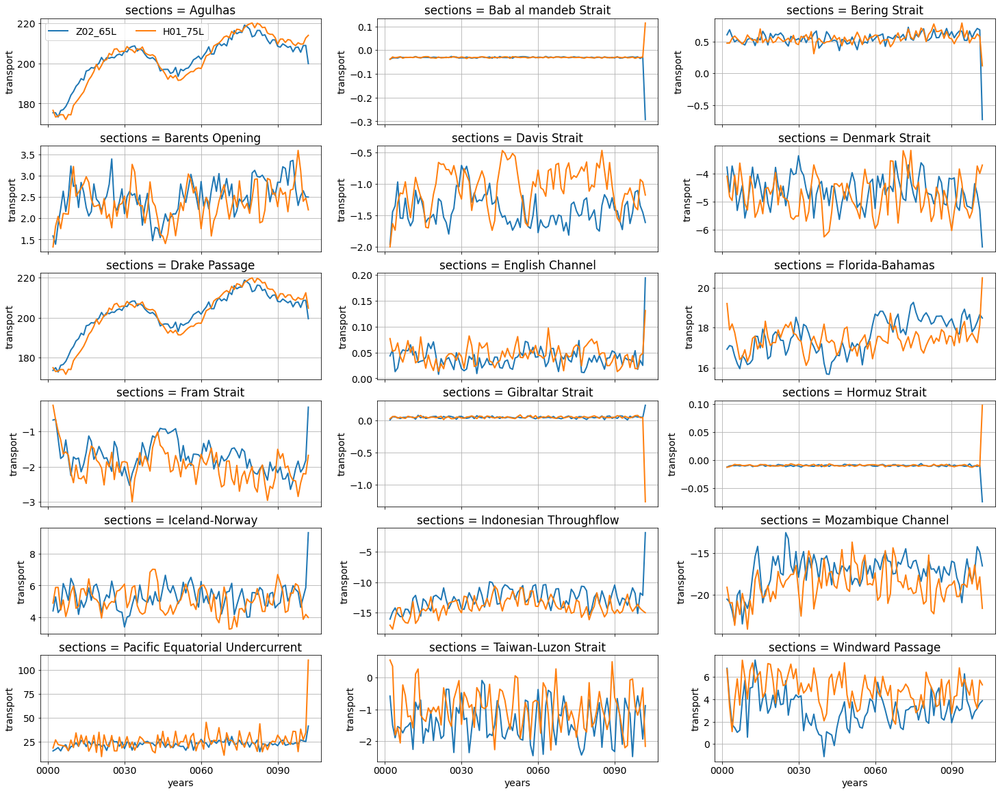

In [23]:
fig, ax = plt.subplots(nrows=6, ncols=3, figsize=(25,20), sharex=True)
ax1 = ax.flatten()
for p in range(len(ds.sections)):
  for i in range(len(exps)):
    ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_section_transports.nc')
    ds.transport.isel(sections=p).plot(ax=ax1[p], label=labels[i], lw=2)
  ax1[p].set_xlabel('')
  ax1[p].grid()
    
ax1[0].legend(ncol=4)
for i in [-3, -2, -1]:
  ax1[i].set_xlabel('years')

## Horizontal Mean bias versus time

In [24]:
start_date ='0001-01-01'
end_date   ='0099-12-31'

In [25]:
i=0
ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_temp_bias.nc')
print(ds.region.values)

['Global' 'MedSea' 'BalticSea' 'HudsonBay' 'Arctic' 'PacificOcean'
 'AtlanticOcean' 'IndianOcean' 'SouthernOcean' 'LabSea' 'BaffinBay']


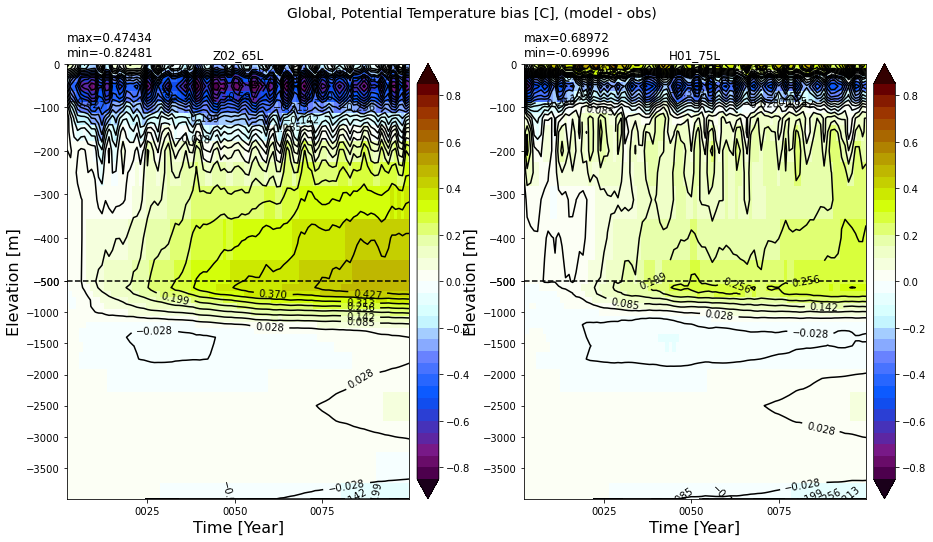

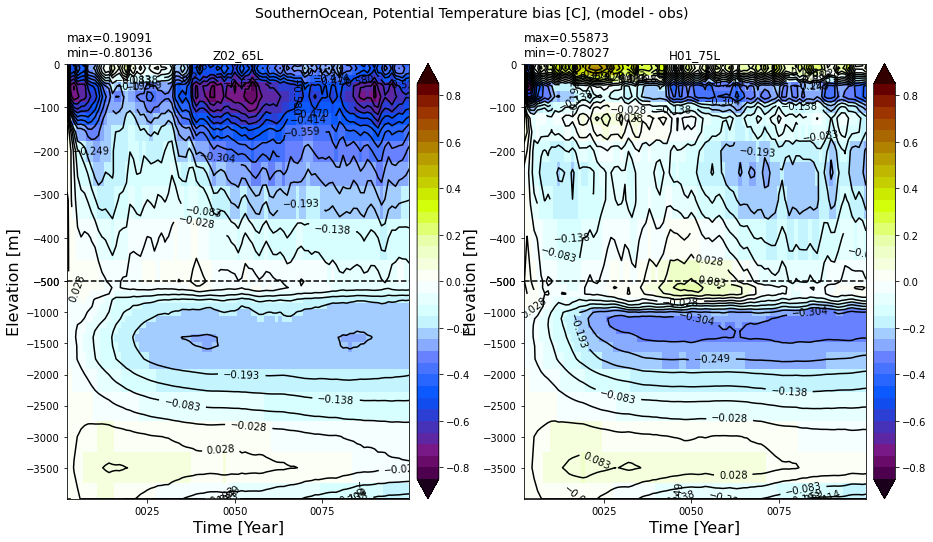

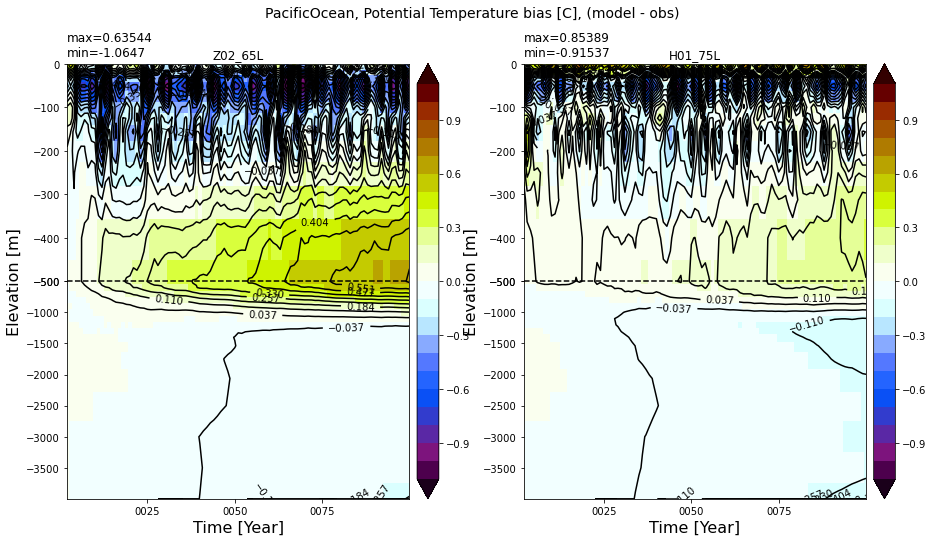

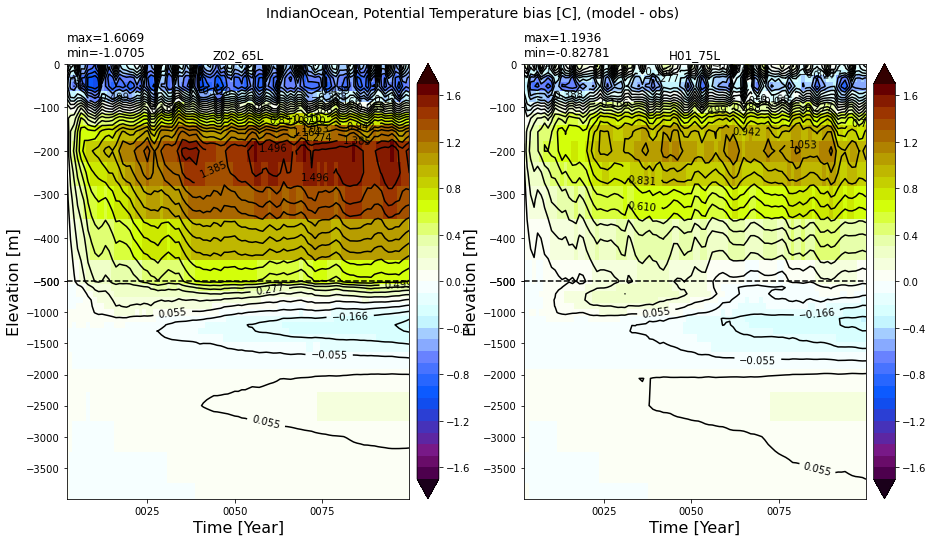

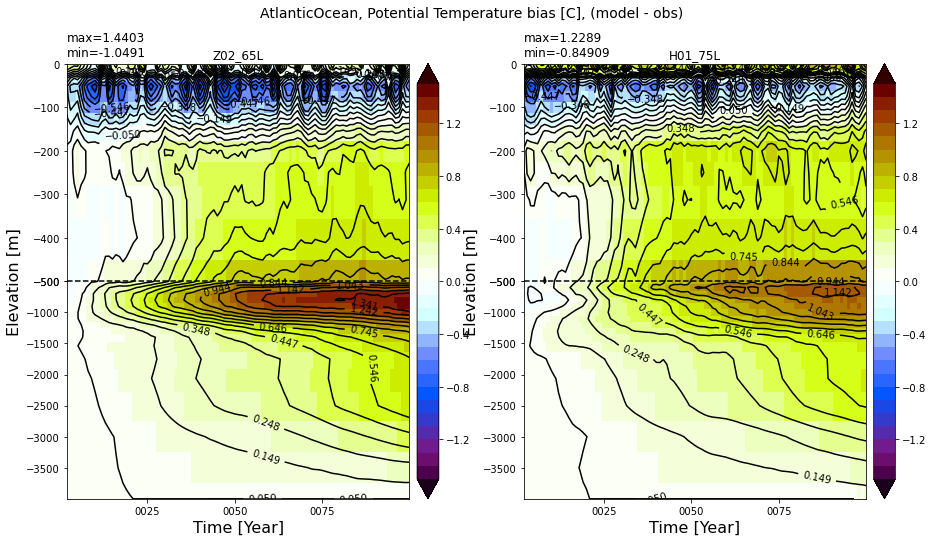

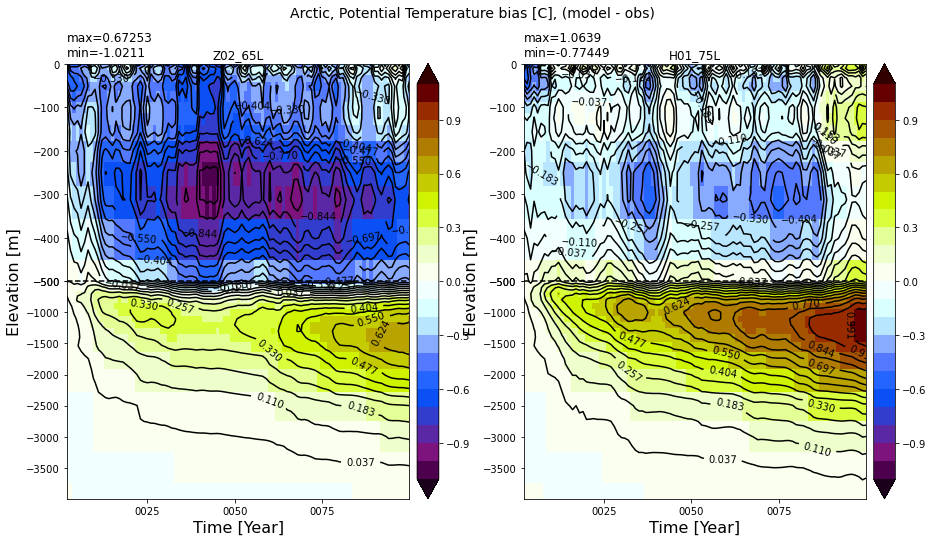

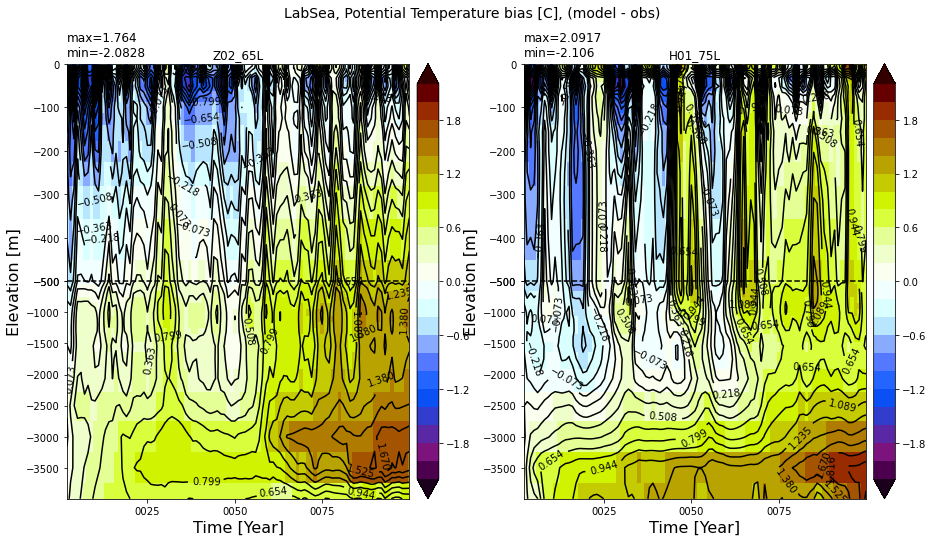

In [26]:
%matplotlib inline
reg_mom = ['Global','SouthernOcean','PacificOcean','IndianOcean','AtlanticOcean',
           'Arctic','LabSea']
reg_pop = [0,1,2,3,6,10,8]

path1='../../'+exps[0]+'/ncfiles/'+exps[0]+'_temp_bias.nc'
ds_mom1 = xr.open_dataset(path1).sel(time=slice(start_date, end_date)) 
path2='../../'+exps[1]+'/ncfiles/'+exps[1]+'_temp_bias.nc'
ds_mom2 = xr.open_dataset(path2).sel(time=slice(start_date, end_date))  

for m,p in zip(reg_mom,reg_pop):
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,8), sharex=True)
  plt.suptitle(str(m)+', Potential Temperature bias [C], (model - obs)', fontsize=14)
  splitscale =  [0., -500., -4000]
  dummy_mom1 = np.ma.masked_invalid(ds_mom1.sel(region=m).temp_bias.values)
  dummy_mom2 = np.ma.masked_invalid(ds_mom2.sel(region=m).temp_bias.values)
  
  cmax = np.max([np.max(np.abs(dummy_mom1)), np.max(np.abs(dummy_mom2))])
  clim = (-cmax, cmax)
  clevs = np.linspace(-cmax,cmax,30)
  ztplot(dummy_mom1, ds_mom1.time.values, ds_mom1.z_l.values*-1, ignore=np.nan, splitscale=splitscale, 
         contour=True, axis=ax.flat[0] , title=labels[0], extend='both', colormap='dunnePM', 
         autocenter=True, tunits='Year', clim=clim, clevs=clevs) 

  ztplot(dummy_mom2, ds_mom2.time.values, ds_mom2.z_l.values*-1, ignore=np.nan, splitscale=splitscale, 
         contour=True, axis=ax.flat[1] , title=labels[1], extend='both', colormap='dunnePM', 
         autocenter=True, tunits='Year', clim=clim, clevs=clevs)

  if saveplot:
    fname = 'PNG/temp_bias.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)  

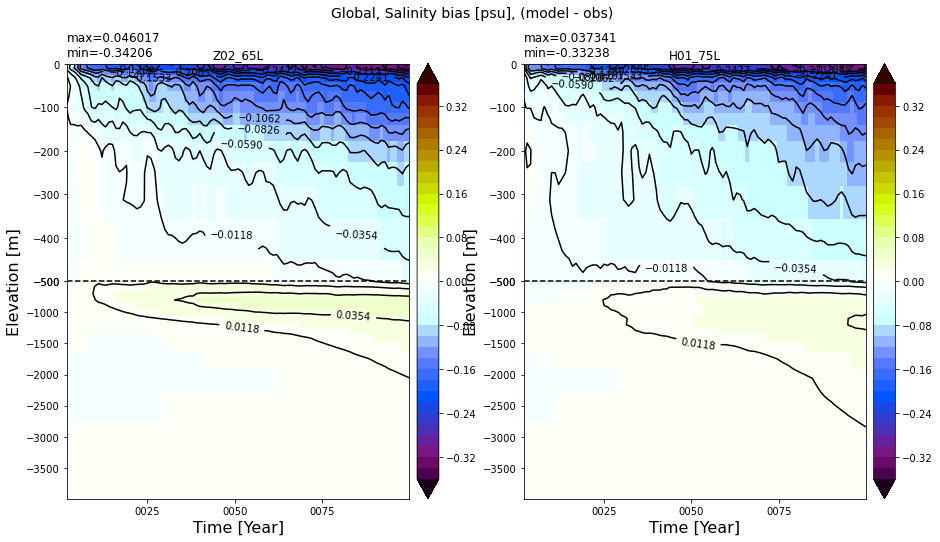

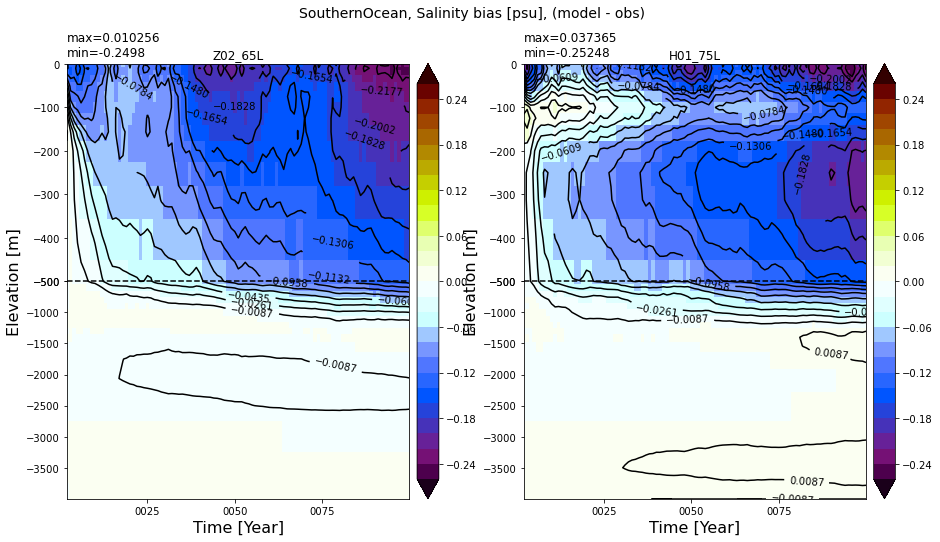

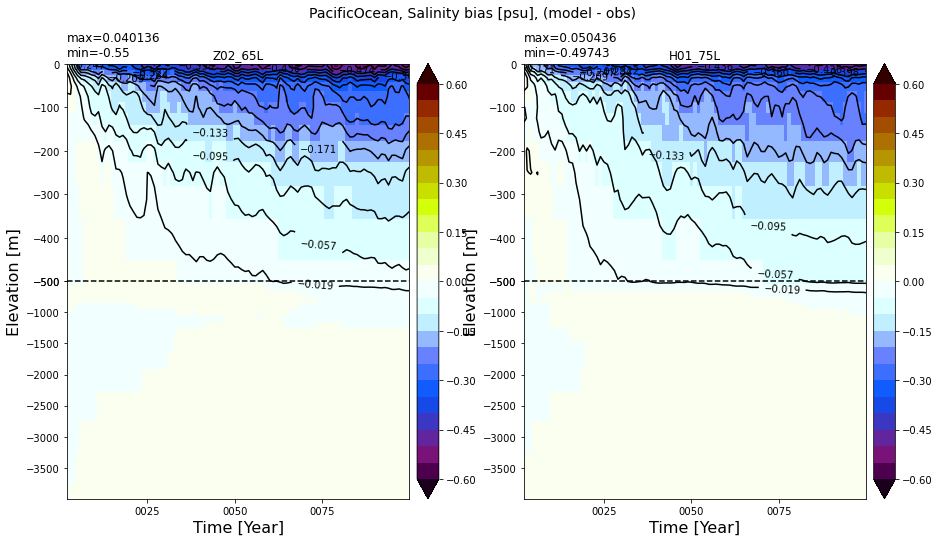

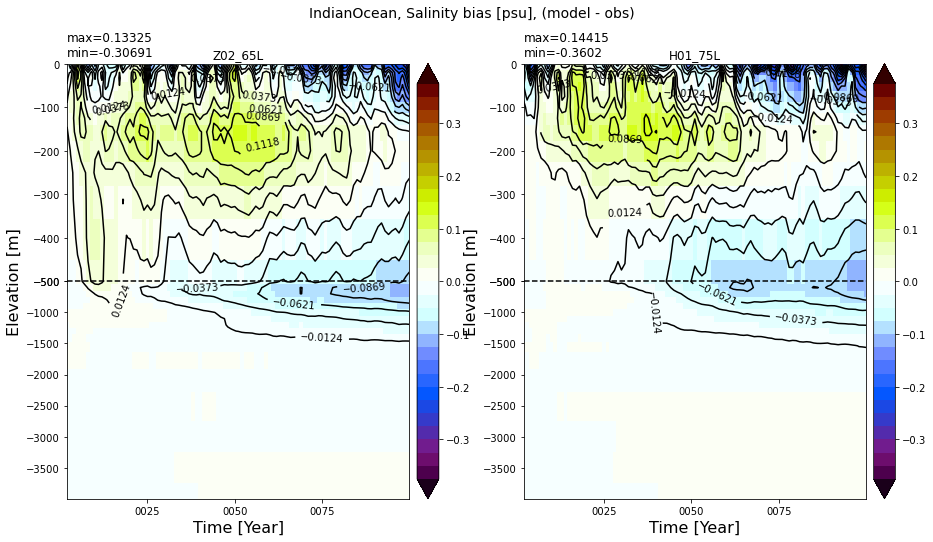

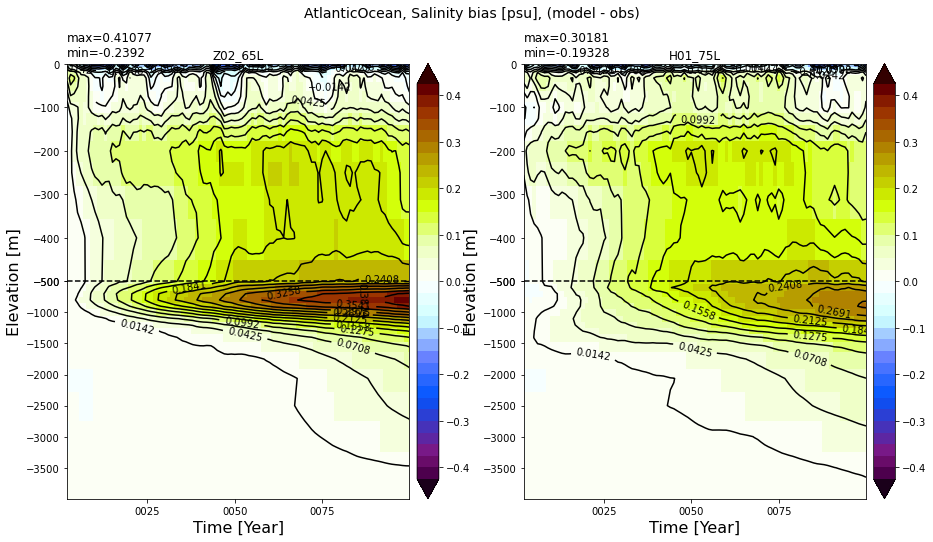

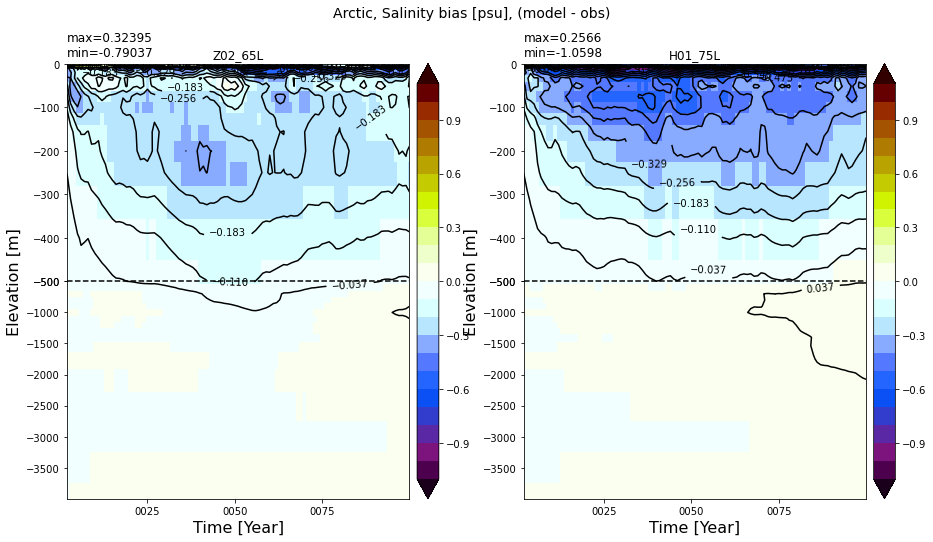

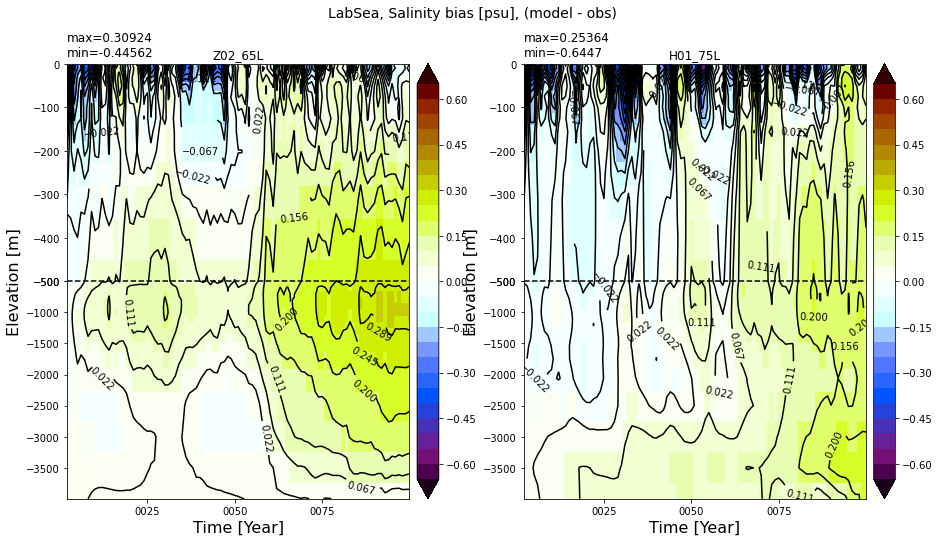

In [27]:
%matplotlib inline
reg_mom = ['Global','SouthernOcean','PacificOcean','IndianOcean','AtlanticOcean','Arctic','LabSea']
reg_pop = [0,1,2,3,6,10,8]

path1='../../'+exps[0]+'/ncfiles/'+exps[0]+'_salt_bias.nc'
ds_mom1 = xr.open_dataset(path1).sel(time=slice(start_date, end_date))
path2='../../'+exps[1]+'/ncfiles/'+exps[1]+'_salt_bias.nc'
ds_mom2 = xr.open_dataset(path2).sel(time=slice(start_date, end_date))

for m,p in zip(reg_mom,reg_pop):
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,8), sharex=True)
  plt.suptitle(str(m)+', Salinity bias [psu], (model - obs)', fontsize=14)
  splitscale =  [0., -500., -4000]
  dummy_mom1 = np.ma.masked_invalid(ds_mom1.sel(region=m).salt_bias.values)
  dummy_mom2 = np.ma.masked_invalid(ds_mom2.sel(region=m).salt_bias.values)
  
 
  cmax = np.max([np.max(np.abs(dummy_mom1)), np.max(np.abs(dummy_mom2))])
  clim = (-cmax, cmax)
  clevs = np.linspace(-cmax,cmax,30)

  ztplot(dummy_mom1, ds_mom1.time.values, ds_mom1.z_l.values*-1, ignore=np.nan, splitscale=splitscale, 
         contour=True, axis=ax.flat[0] , title=labels[0], extend='both', colormap='dunnePM', 
         autocenter=True, tunits='Year', clim=clim, clevs=clevs) 

  ztplot(dummy_mom2, ds_mom2.time.values, ds_mom2.z_l.values*-1, ignore=np.nan, splitscale=splitscale, 
         contour=True, axis=ax.flat[1] , title=labels[1], extend='both', colormap='dunnePM', 
         autocenter=True, tunits='Year', clim=clim, clevs=clevs)

  if saveplot:
    fname = 'PNG/salt_bias_mom.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)  

## T/S difference at selected vertical levels

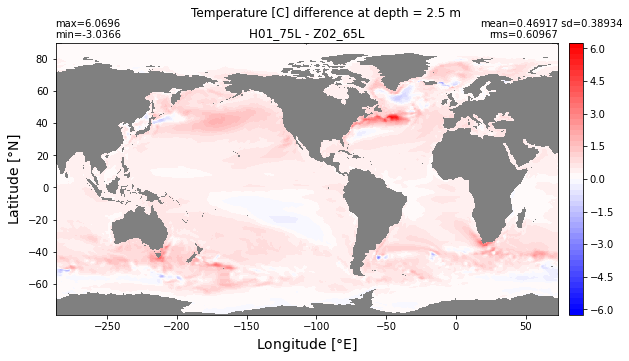

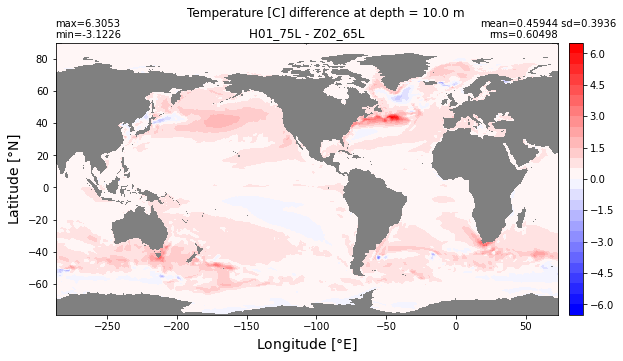

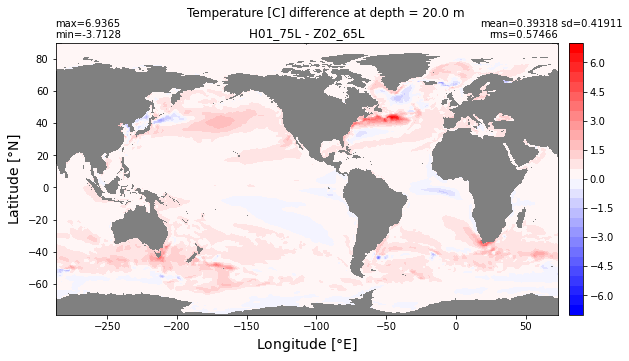

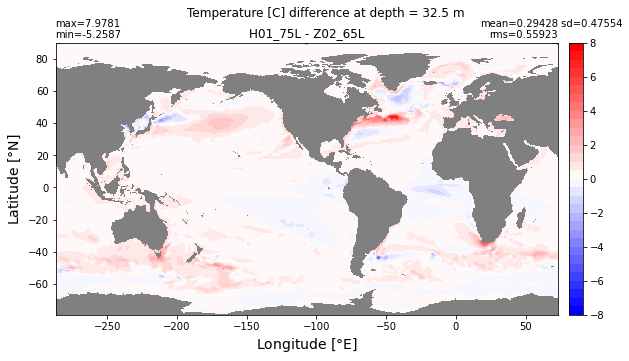

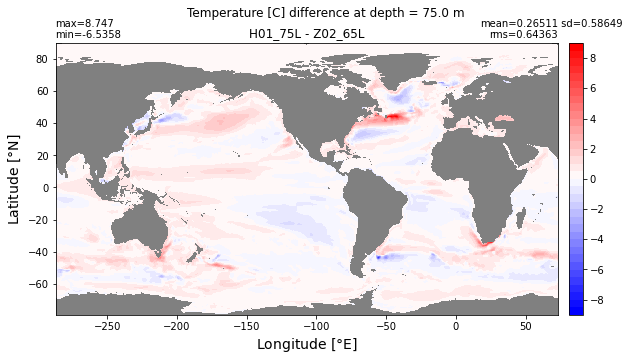

...

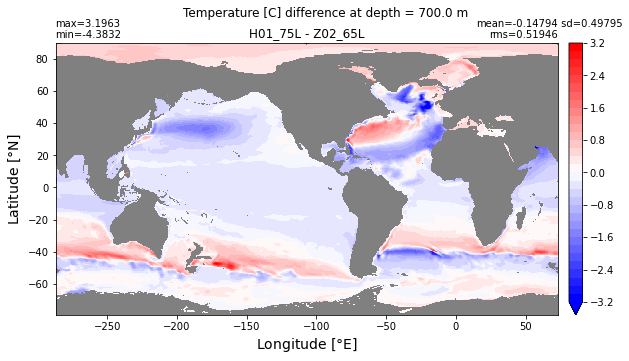

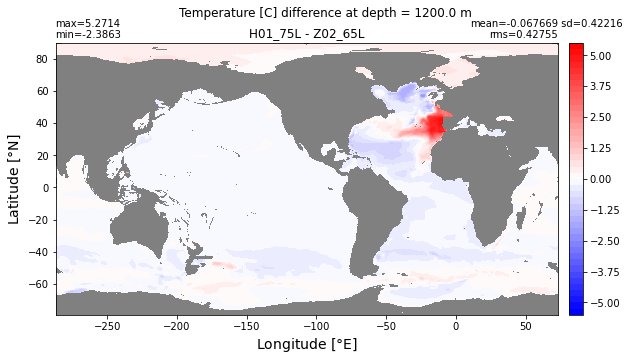

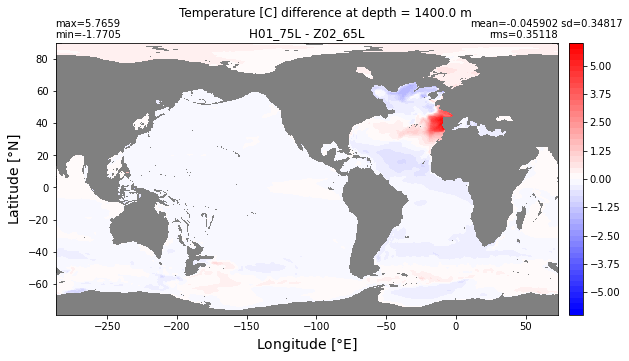

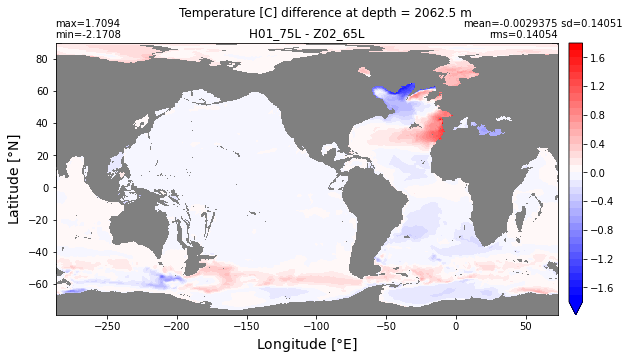

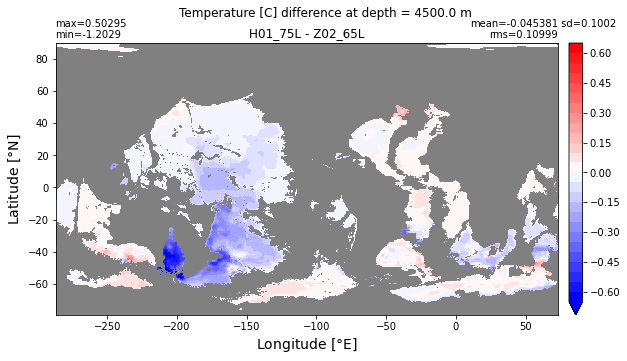

In [28]:
%matplotlib inline
# change kall to see bias at other depths
kall=[0,1,2,3,5,10,15,20,22,25,30]

for k in kall:
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))
  ds1 = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_thetao_time_mean.nc')
  temp_mom1 = np.ma.masked_invalid(ds1.thetao[k,:].values)
  ds2 = xr.open_dataset('../../'+exps[1]+'/ncfiles/'+exps[1]+'_thetao_time_mean.nc')
  temp_mom2 = np.ma.masked_invalid(ds2.thetao[k,:].values)
  cmax = np.max(np.abs(temp_mom2)-np.abs(temp_mom1))
  clim = (-cmax, cmax)
        
  xyplot(temp_mom2-temp_mom1, grd.geolon, grd.geolat, grd.area_t, centerlabels=True,
           title=str(labels[1]+' - '+labels[0]), axis=ax, nbins=50, clim=clim,
           colormap=plt.cm.bwr)
  
  plt.suptitle('Temperature [C] difference at depth = {} m' \
              .format(ds1.z_l[k].values))  

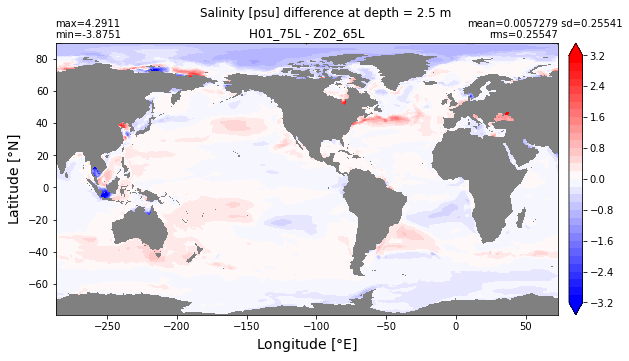

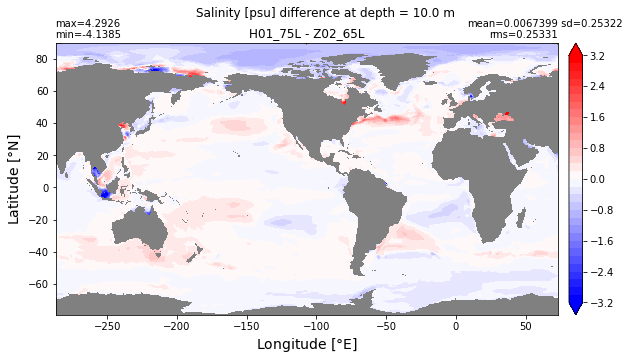

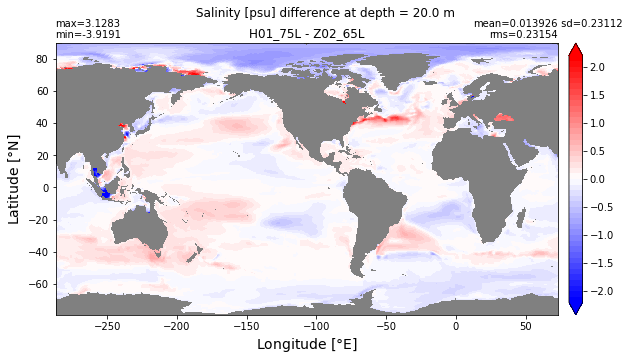

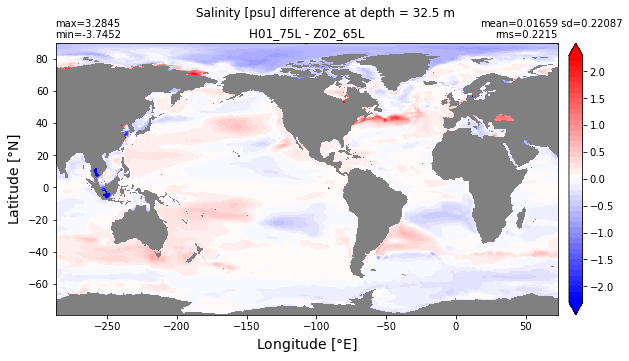

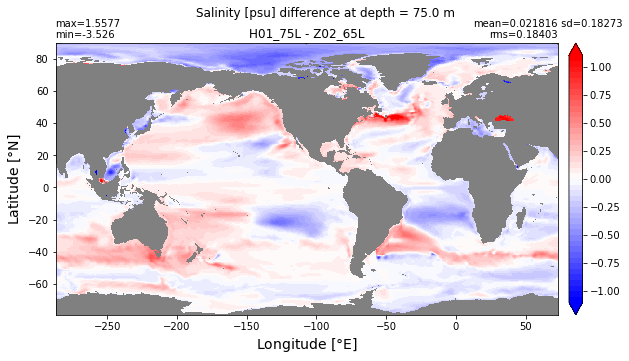

...

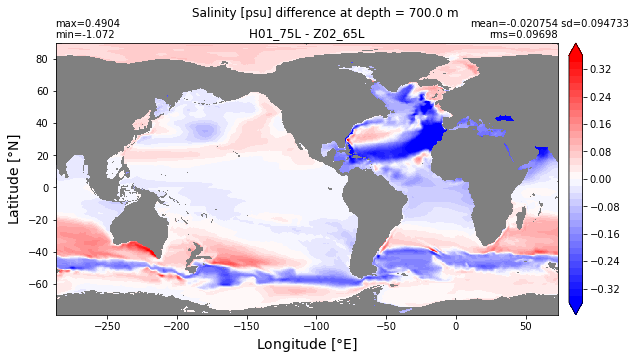

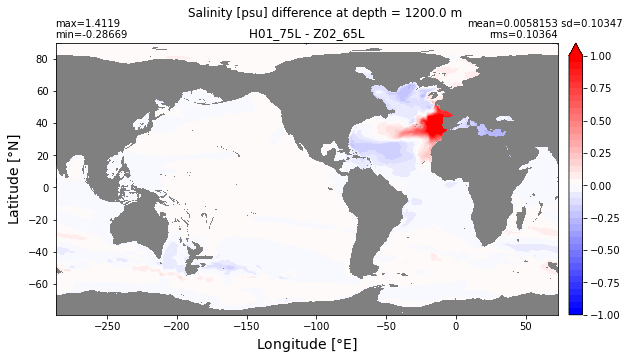

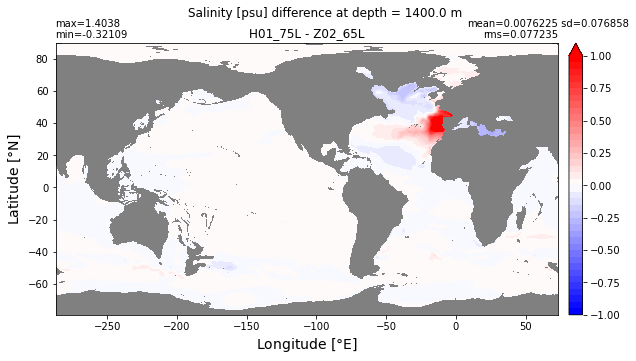

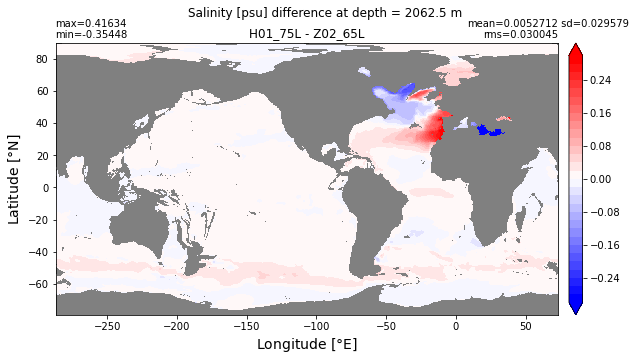

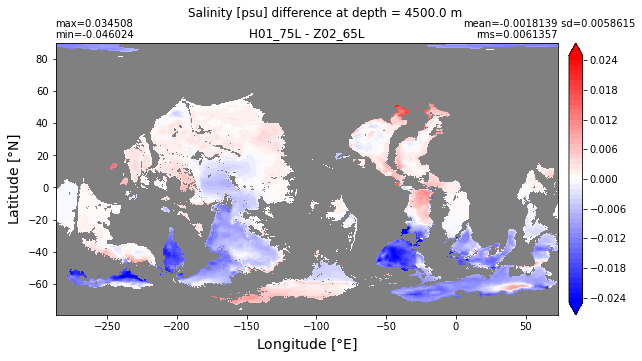

In [29]:
%matplotlib inline
# change kall to see bias at other depths
kall=[0,1,2,3,5,10,15,20,22,25,30]

for k in kall:
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))
  ds1 = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_so_time_mean.nc')
  salt_mom1 = np.ma.masked_invalid(ds1.so[k,:].values)
  ds2 = xr.open_dataset('../../'+exps[1]+'/ncfiles/'+exps[1]+'_so_time_mean.nc')
  salt_mom2 = np.ma.masked_invalid(ds2.so[k,:].values)
  cmax = np.max(np.abs(salt_mom2)-np.abs(salt_mom1)) * 0.7
  clim = (-cmax, cmax)
        
  xyplot(salt_mom2-salt_mom1, grd.geolon, grd.geolat, grd.area_t, centerlabels=True,
           title=str(labels[1]+' - '+labels[0]), axis=ax, nbins=50, clim=clim,
           colormap=plt.cm.bwr)
  
  plt.suptitle('Salinity [psu] difference at depth = {} m' \
              .format(ds1.z_l[k].values))  

## T/S bias at selected vertical levels

In [30]:
def find_nearest(array, value):
    '''Find nearest value and return its indice'''
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def pop_add_cyclic(ds):

    nj = ds.TLAT.shape[0]
    ni = ds.TLONG.shape[1]

    xL = int(ni/2 - 1)
    xR = int(xL + ni)

    tlon = ds.TLONG.data
    tlat = ds.TLAT.data

    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon)
    lon  = np.concatenate((tlon, tlon + 360.), 1)
    lon = lon[:, xL:xR]

    if ni == 320:
        lon[367:-3, 0] = lon[367:-3, 0] + 360.
    lon = lon - 360.

    lon = np.hstack((lon, lon[:, 0:1] + 360.))
    if ni == 320:
        lon[367:, -1] = lon[367:, -1] - 360.

    #-- trick cartopy into doing the right thing:
    #   it gets confused when the cyclic coords are identical
    lon[:, 0] = lon[:, 0] - 1e-8

    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))

    TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
    TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))

    dso = xr.Dataset({'TLAT': TLAT, 'TLONG': TLONG})

    # copy vars
    varlist = [v for v in ds.data_vars if v not in ['TLAT', 'TLONG']]
    for v in varlist:
        v_dims = ds[v].dims
        if not ('nlat' in v_dims and 'nlon' in v_dims):
            dso[v] = ds[v]
        else:
            # determine and sort other dimensions
            other_dims = set(v_dims) - {'nlat', 'nlon'}
            other_dims = tuple([d for d in v_dims if d in other_dims])
            lon_dim = ds[v].dims.index('nlon')
            field = ds[v].data
            field = np.concatenate((field, field), lon_dim)
            field = field[..., :, xL:xR]
            field = np.concatenate((field, field[..., :, 0:1]), lon_dim)
            dso[v] = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'),
                                  attrs=ds[v].attrs)


    # copy coords
    for v, da in ds.coords.items():
        if not ('nlat' in da.dims and 'nlon' in da.dims):
            dso = dso.assign_coords(**{v: da})


    return dso

In [31]:
grid = pop_tools.get_grid('POP_gx1v7')
grid_o = pop_add_cyclic(grid)

In [32]:
# load WOA18 data for MOM6
obs_path = '/glade/u/home/gmarques/Notebooks/CESM_MOM6/WOA18_remapping/'
obs_temp_mom = xr.open_dataset(obs_path+'WOA18_TEMP_tx0.66v1_34lev_ann_avg.nc')
obs_temp_mom['xh'] = grd.xh; obs_temp_mom['yh'] = grd.yh
obs_salt_mom = xr.open_dataset(obs_path+'WOA18_SALT_tx0.66v1_34lev_ann_avg.nc')
obs_salt_mom['xh'] = grd.xh; obs_salt_mom['yh'] = grd.yh

In [33]:
# load PHC2 data for POP
phc_path = '/glade/p/cesm/omwg/obs_data/phc/'
phc_temp_pop = pop_add_cyclic(xr.open_dataset(phc_path+'PHC2_TEMP_gx1v7_60lev_ann_avg.nc', 
                             decode_coords=False, decode_times=False).rename({'Y': 'nlat','TEMP':'thetao',
                    'X':'nlon'}).assign_coords({'TLAT': grid.TLAT, 'TLONG':grid.TLONG}).drop('nlat').drop('nlon'))
phc_salt_pop = pop_add_cyclic(xr.open_dataset(phc_path+'PHC2_SALT_gx1v7_60lev_ann_avg.nc', 
                             decode_coords=False, decode_times=False).rename({'Y': 'nlat','SALT':'so',
                    'X':'nlon'}).assign_coords({'TLAT': grid.TLAT, 'TLONG':grid.TLONG}).drop('nlat').drop('nlon'))

#### Temperature

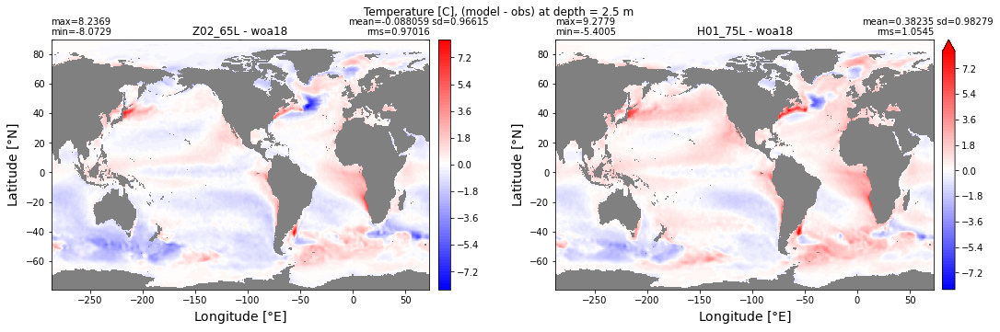

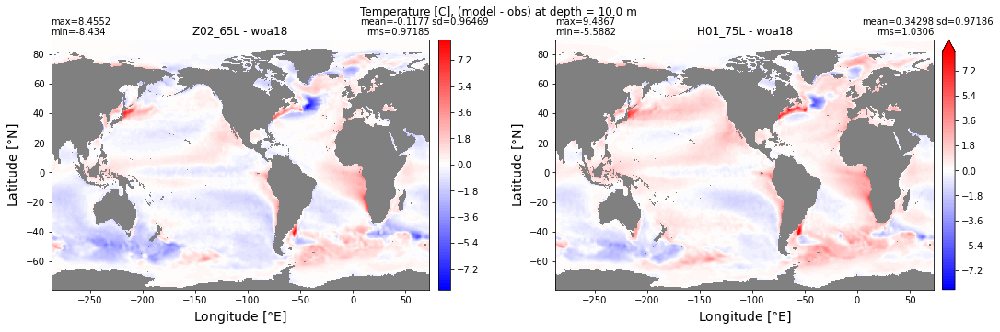

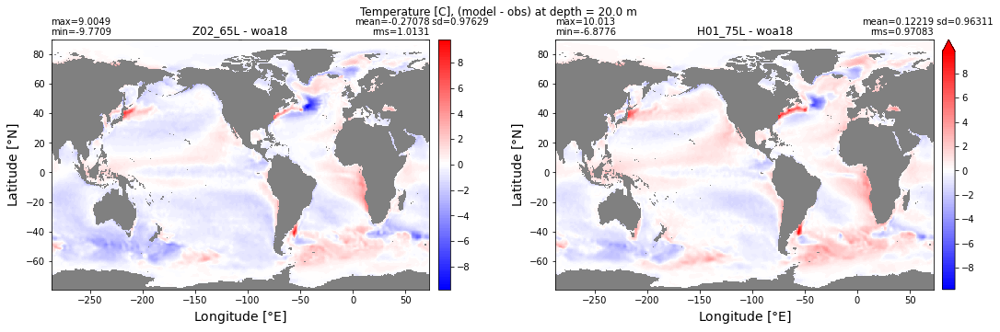

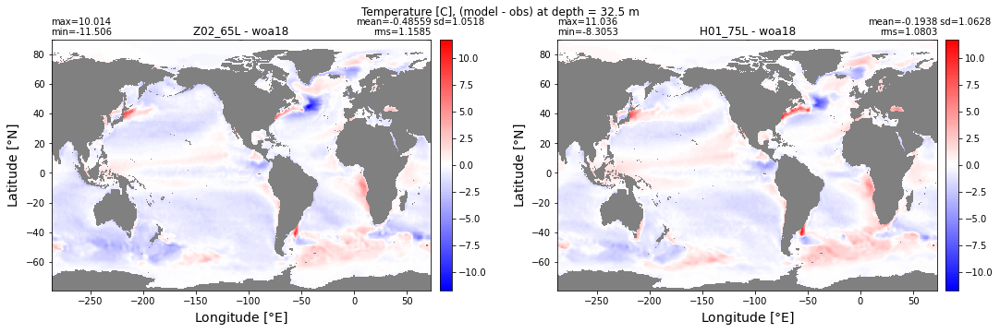

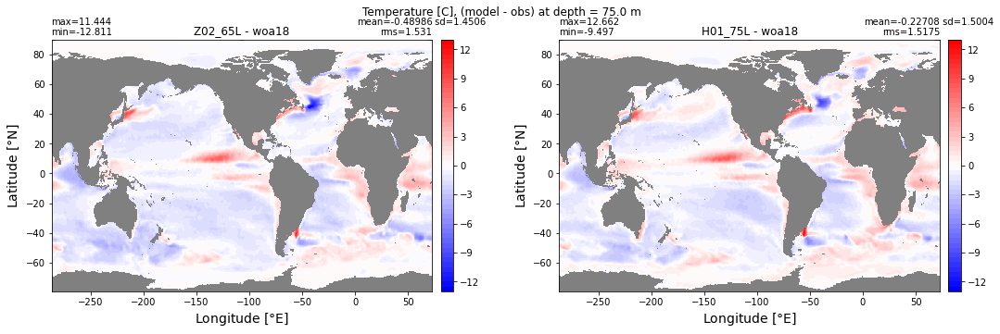

...

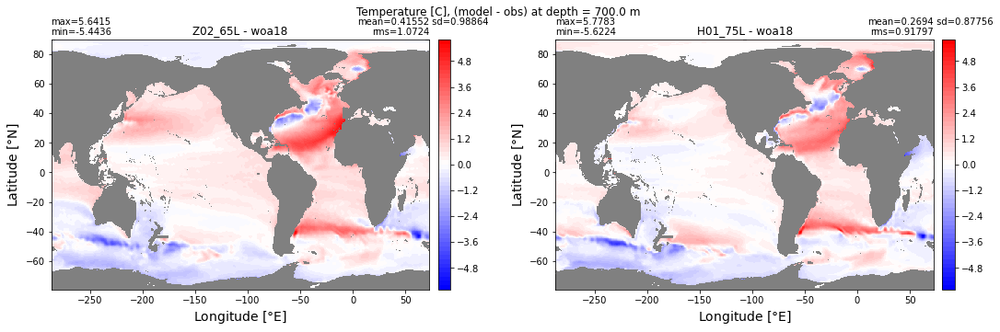

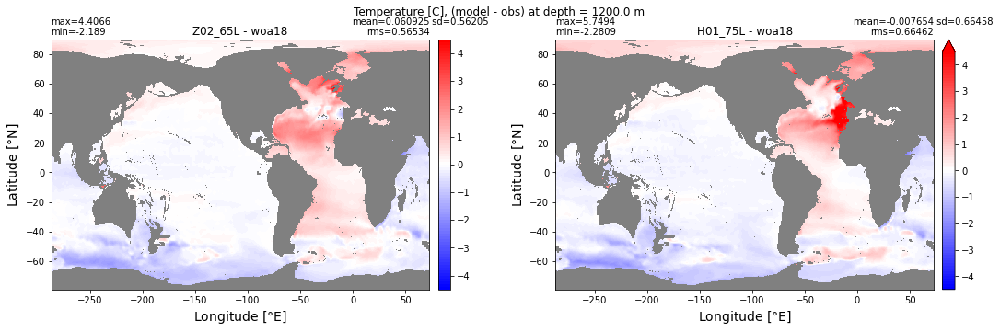

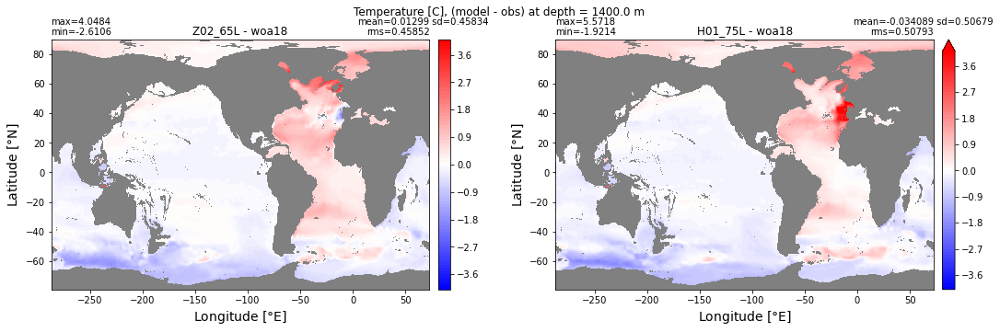

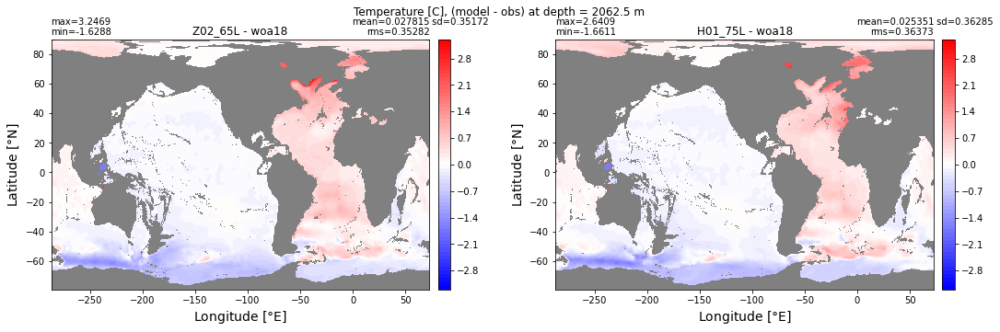

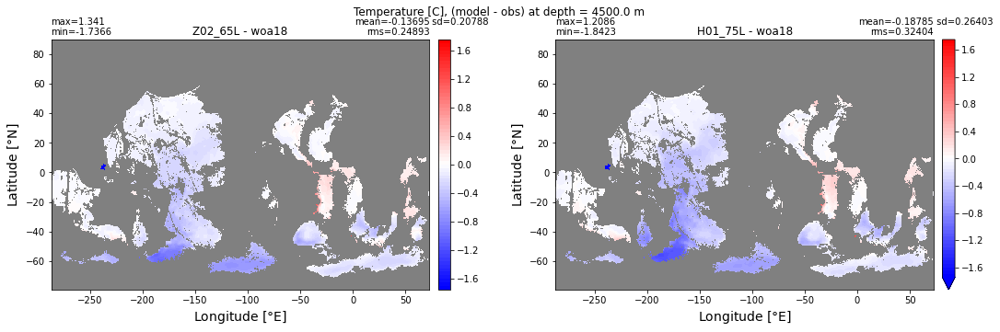

In [34]:
%matplotlib inline
# change kall to see bias at other depths
kall=[0,1,2,3,5,10,15,20,22,25,30]

for k in kall:
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,5))
  ax1 = ax.flatten()
  for i in range(len(exps)):
    ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    temp_mom = np.ma.masked_invalid(ds.thetao[k,:].values)
    temp_mom_obs = np.ma.masked_invalid(obs_temp_mom['theta0'][k,:].values)
    if i == 0:
      cmax = np.max(np.abs(temp_mom-temp_mom_obs))
      clim = (-cmax, cmax)    
    # MOM6
    xyplot(temp_mom-temp_mom_obs, grd.geolon, grd.geolat, grd.area_t, 
           title=str(labels[i]+' - woa18'), axis=ax1[i], 
           clim=clim, nbins=100, colormap=plt.cm.bwr, centerlabels=True)
  
  plt.suptitle('Temperature [C], (model - obs) at depth = {} m' \
              .format(ds.z_l[k].values))  
  if saveplot:
    fname = 'PNG/temp_bias_{}m.png'.format(ds.z_l[k].values)
    plt.savefig(fname, bbox_inches='tight',dpi=300)

#### Salinity

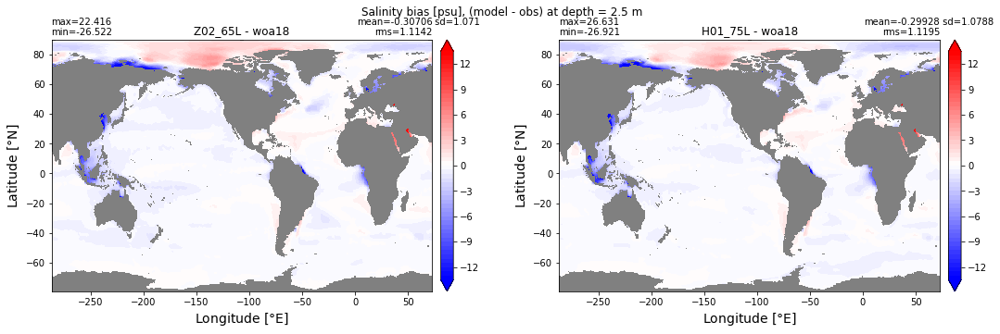

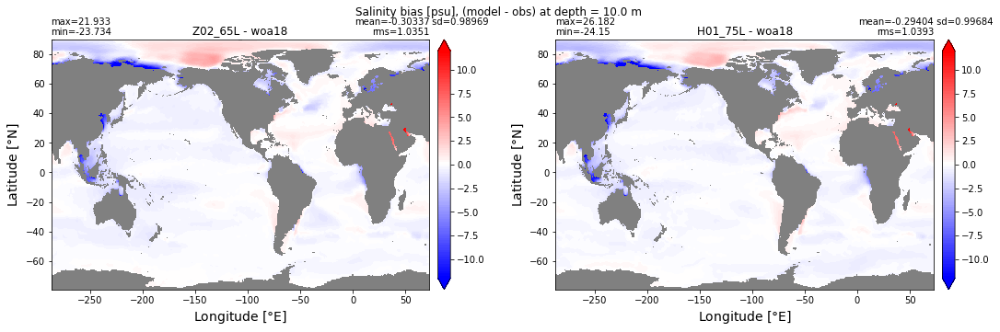

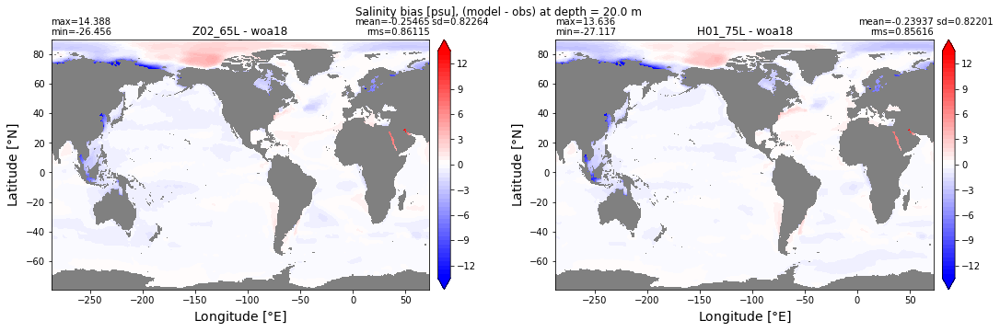

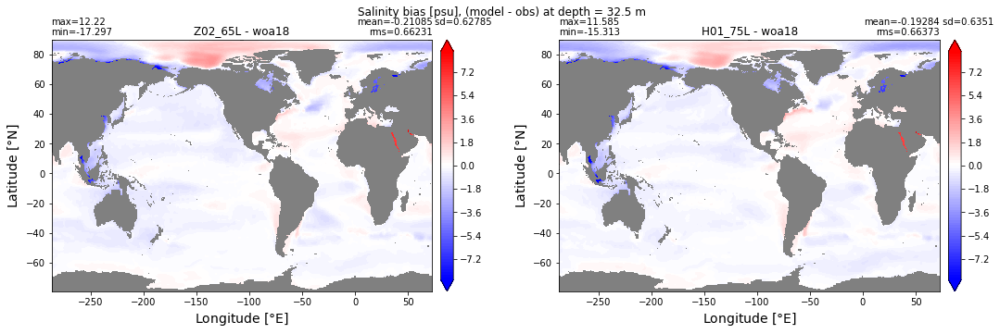

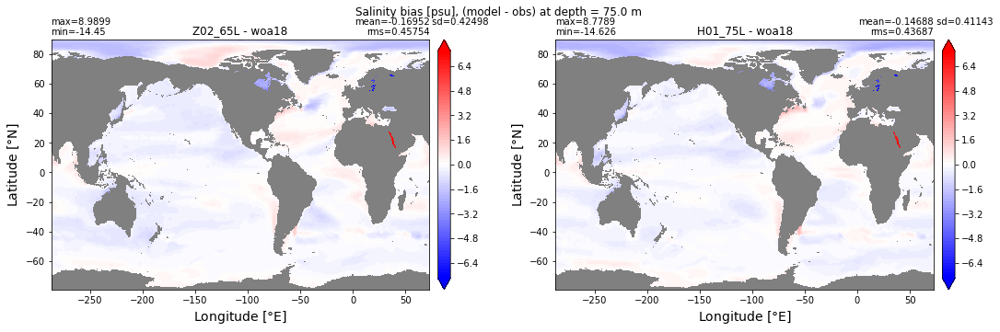

...

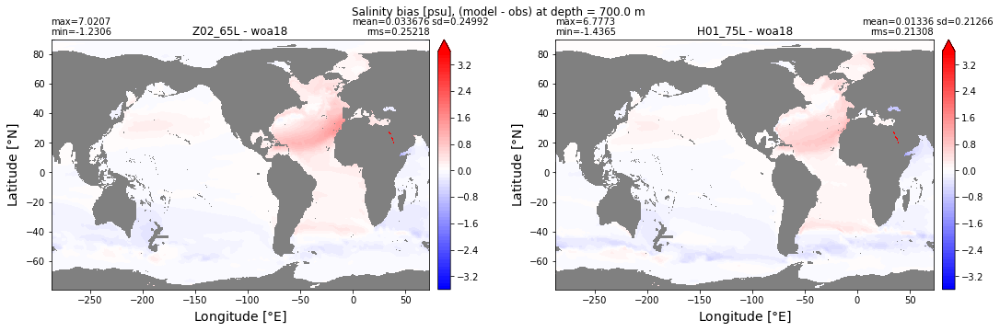

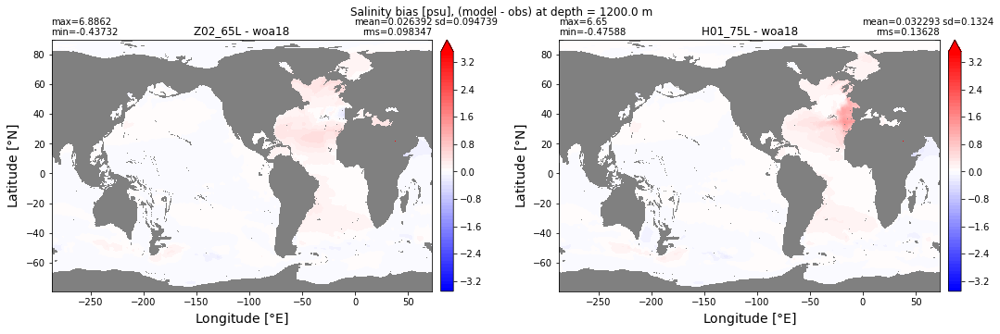

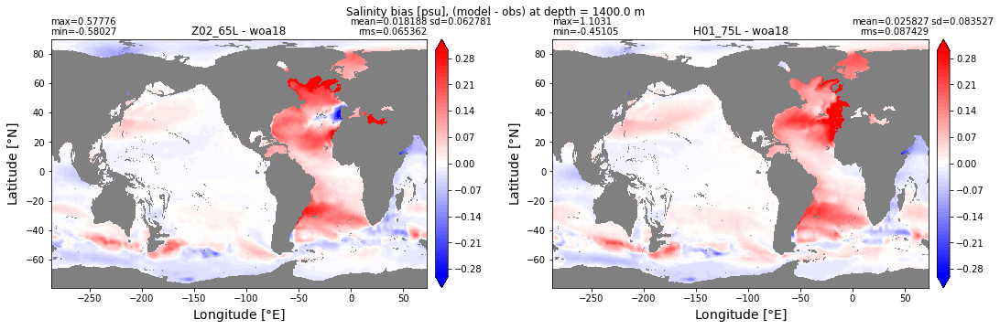

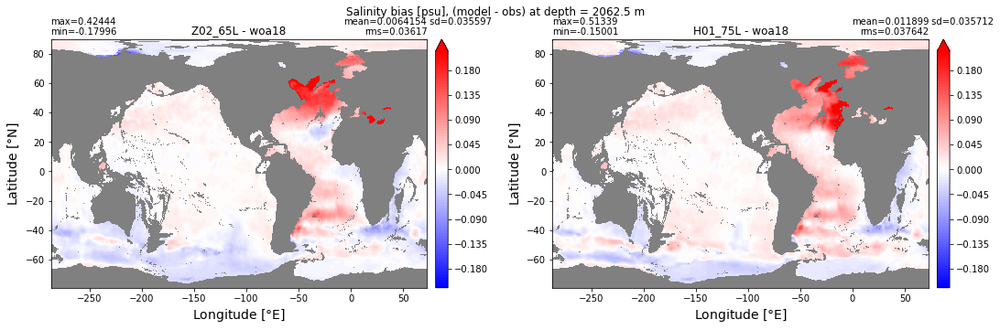

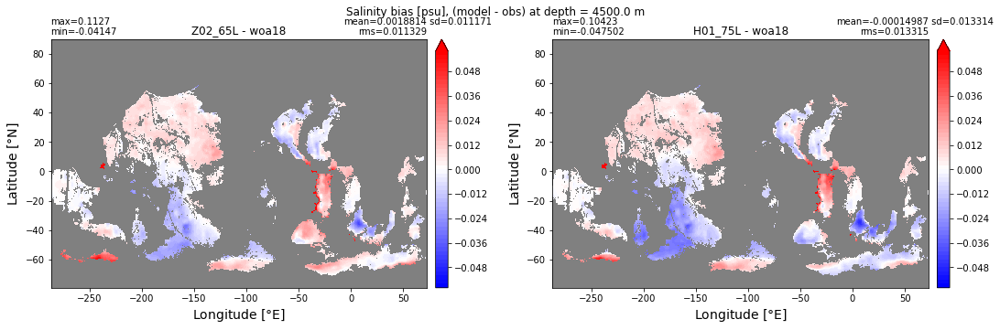

In [35]:
%matplotlib inline
# change kall to see bias at other depths
kall=[0,1,2,3,5,10,15,20,22,25,30]


for k in kall:
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,5))
  ax1 = ax.flatten()
  for i in range(len(exps)):
    ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    salt_mom = np.ma.masked_invalid(ds.so[k,:].values)
    salt_mom_obs = np.ma.masked_invalid(obs_salt_mom['s_an'][k,:].values)
    if i == 0:
      cmax = np.max(np.abs(salt_mom-salt_mom_obs)) * 0.5
      clim = (-cmax, cmax)    
    # MOM6
    xyplot(salt_mom-salt_mom_obs, grd.geolon, grd.geolat, grd.area_t, 
           title=str(labels[i]+' - woa18'), axis=ax1[i], 
           clim=clim, nbins=100, colormap=plt.cm.bwr, centerlabels=True)
    plt.suptitle('Salinity bias [psu], (model - obs) at depth = {} m' \
              .format(ds.z_l[k].values))  
  if saveplot:
    fname = 'PNG/salt_bias_{}m.png'.format(ds.z_l[k].values)
    plt.savefig(fname, bbox_inches='tight',dpi=300)

## Zonally averaged T/S Bias  

In [36]:
# load these again without renaming variables
phc_temp_pop = pop_add_cyclic(xr.open_dataset(phc_path+'PHC2_TEMP_gx1v7_60lev_ann_avg.nc', 
                             decode_coords=False, decode_times=False))
phc_salt_pop = pop_add_cyclic(xr.open_dataset(phc_path+'PHC2_SALT_gx1v7_60lev_ann_avg.nc', 
                             decode_coords=False, decode_times=False))

ds_pop_s = xr.open_dataset('/glade/scratch/gmarques/g210.GIAF_JRA.v13.gx1v7.01_so_time_mean.nc')
ds_pop_t = xr.open_dataset('/glade/scratch/gmarques/g210.GIAF_JRA.v13.gx1v7.01_thetao_time_mean.nc')

In [37]:
# POP
# reconstruct interfaces
elev_pop = np.concatenate([0,np.diff(ds_pop_t.z_l/100.).cumsum(),6000.], axis=None)
[_, z_pop] = np.meshgrid(grid.TLAT.mean('nlon').values, -elev_pop)
pop_temp_bias = xr.DataArray((ds_pop_t.thetao.values) - (phc_temp_pop.TEMP.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_pop_t.z_l, 'yh': ds_pop_t.yh, 'xh':ds_pop_t.xh})
pop_salt_bias = xr.DataArray((ds_pop_s.so.values) - (phc_salt_pop.SALT.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_pop_t.z_l, 'yh': ds_pop_t.yh, 'xh':ds_pop_t.xh})
area_pop = grid.TAREA.where(grid.KMT > 0).rename({'nlat':'yh', 'nlon':'xh'})

# construct a 3D area with land values masked
tmp = np.repeat(area_pop.values[np.newaxis, :, :], len(pop_temp_bias.z_l), axis=0)
area_pop3D = xr.DataArray(tmp, dims=('z_l', 'yh','xh'), 
                          coords={'z_l':pop_temp_bias.z_l.values, 'yh': pop_temp_bias.yh.values, 
                                  'xh':pop_temp_bias.xh.values})

KMT = grid.KMT.rename({'nlat':'yh', 'nlon':'xh'})
for k in range(len(area_pop3D.z_l)):
    area_pop3D[k,:] = area_pop.where(KMT >= k) 

In [38]:
# MOM
basin_code = genBasinMasks(grd.geolon, grd.geolat, depth, xda=True)
# reconstruct interfaces
ds_mom_t = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_thetao_time_mean.nc')
ds_mom_s = xr.open_dataset('../../'+exps[0]+'/ncfiles/'+exps[0]+'_so_time_mean.nc')

elev_mom = np.concatenate([0,np.diff(ds_mom_t.z_l).cumsum(),6000.], axis=None)
[_, z_mom] = np.meshgrid(ds_mom_t.yh.values, -elev_mom)

mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})
mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})
area_mom = xr.DataArray(np.ma.masked_where(grd.wet == 0,grd.area_t), dims=('yh','xh'), coords={'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

# construct a 3D area with land values masked
area = np.ma.masked_where(grd.wet == 0,grd.area_t)
tmp = np.repeat(area[np.newaxis, :, :], len(mom_temp_bias.z_l), axis=0)
area_mom3D = xr.DataArray(tmp, dims=('z_l', 'yh','xh'), 
                          coords={'z_l':mom_temp_bias.z_l.values, 'yh': mom_temp_bias.yh.values, 
                                  'xh':mom_temp_bias.xh.values})
for k in range(len(area_mom3D.z_l)):
    area_mom3D[k,:] = grd_xr.area_t.where(grd_xr.depth_ocean >= area_mom3D.z_l[k]) 

11.16428 64.78855 [391, 434]


### Global

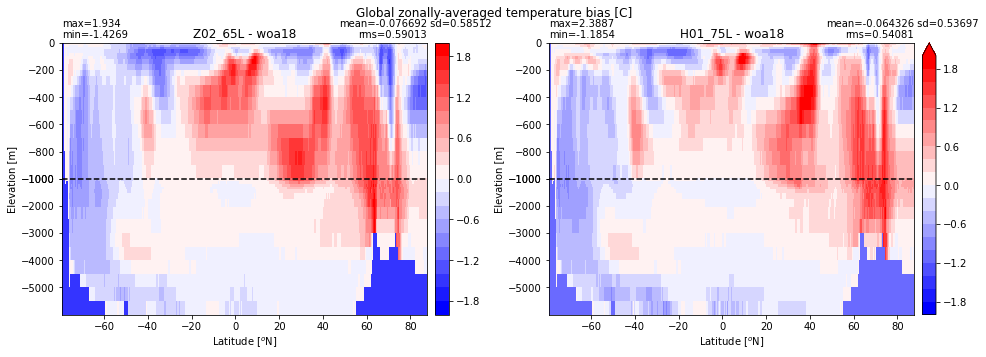

In [39]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Global zonally-averaged temperature bias [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_global = ((mom_temp_bias * area_mom3D).sum('xh')/area_mom3D.sum('xh'))
    if i == 0:
      cmax = np.max(np.abs(mom_temp_global)).values
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_temp_global), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis()


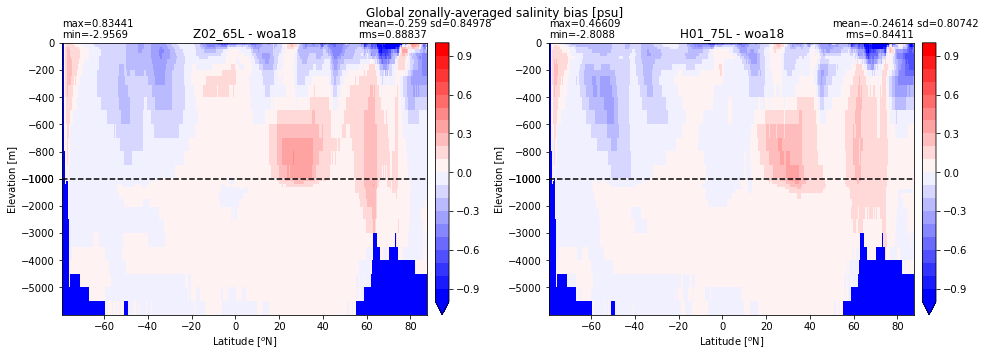

In [40]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Global zonally-averaged salinity bias [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_global = ((mom_salt_bias * area_mom3D).sum('xh')/area_mom3D.sum('xh'))
    if i == 0:
      cmax = np.max(np.abs(mom_salt_global)).values
      clim = (-1, 1)
        
    yzplot(np.ma.masked_invalid(mom_salt_global), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis()

### Atlantic

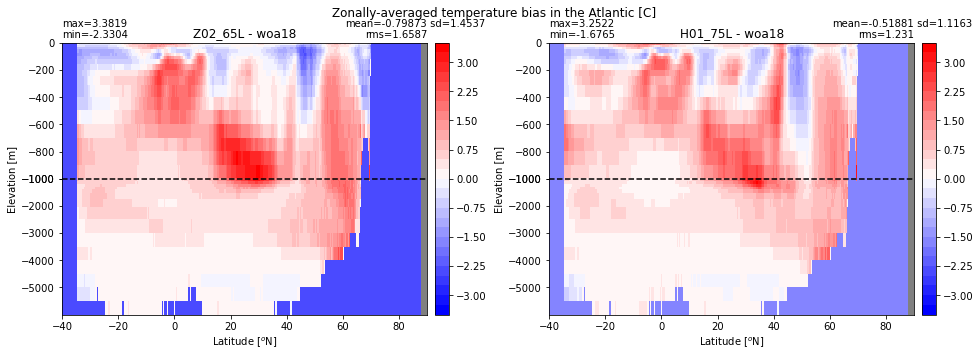

In [41]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged temperature bias in the Atlantic [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_alt = ((basin_code.sel(region='AtlanticOcean')*mom_temp_bias * area_mom3D).sum('xh')/
                (area_mom3D*basin_code.sel(region='AtlanticOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_temp_alt)).values
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_temp_alt.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-40,90)

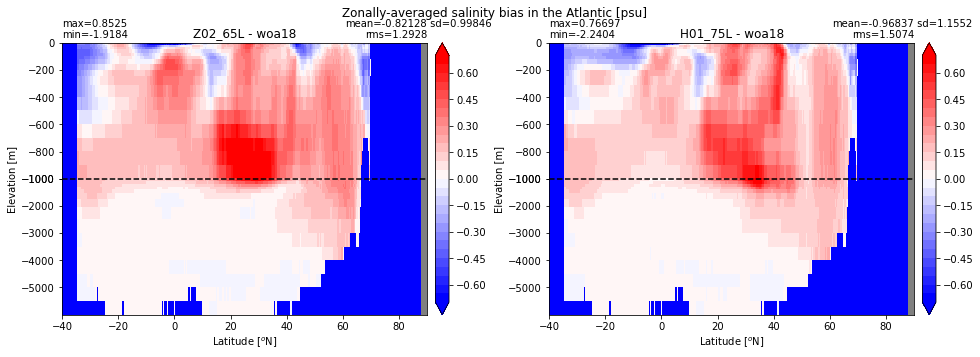

In [42]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged salinity bias in the Atlantic [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_alt = ((basin_code.sel(region='AtlanticOcean')*mom_salt_bias * area_mom3D).sum('xh')/
                (area_mom3D*basin_code.sel(region='AtlanticOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_temp_alt)).values * 0.2
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_salt_alt.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-40,90)

### Pacific

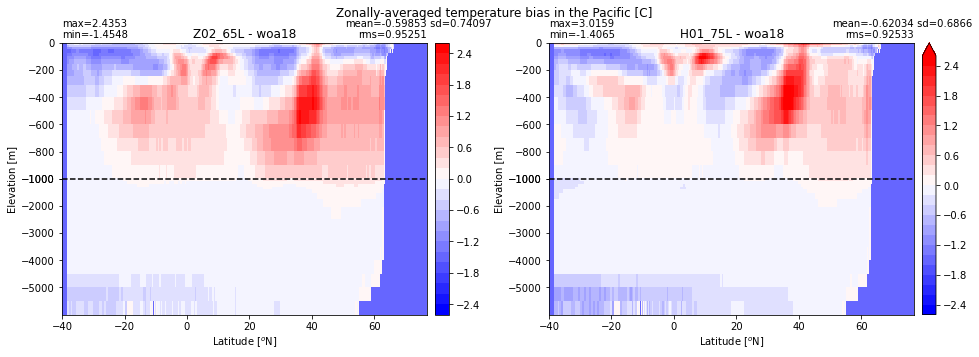

In [43]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged temperature bias in the Pacific [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_pac = ((basin_code.sel(region='PacificOcean')*mom_temp_bias * area_mom3D).sum('xh')/
                (area_mom3D*basin_code.sel(region='PacificOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_temp_pac)).values
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_temp_pac.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-40,77)


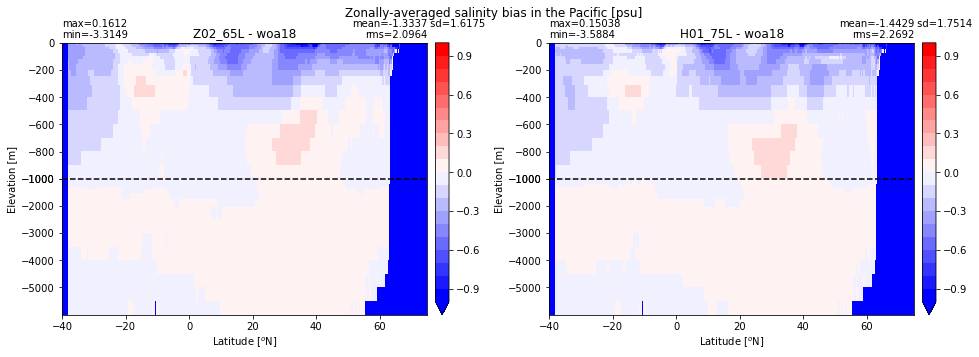

In [44]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged salinity bias in the Pacific [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_pac = ((basin_code.sel(region='PacificOcean')*mom_salt_bias * area_mom3D).sum('xh')/
                (area_mom3D*basin_code.sel(region='PacificOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_salt_pac)).values 
      clim = (-1, 1)
        
    yzplot(np.ma.masked_invalid(mom_salt_pac.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-40,75)


### Southern Ocean

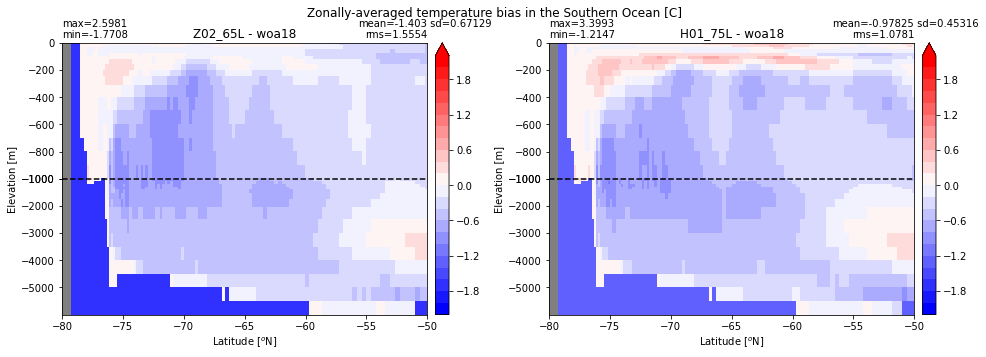

In [45]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged temperature bias in the Southern Ocean [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_so = ((basin_code.sel(region='SouthernOcean')*mom_temp_bias * area_mom3D).sum('xh')/
               (area_mom3D*basin_code.sel(region='SouthernOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_temp_so)).values * 0.8
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_temp_so.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-80,-50)

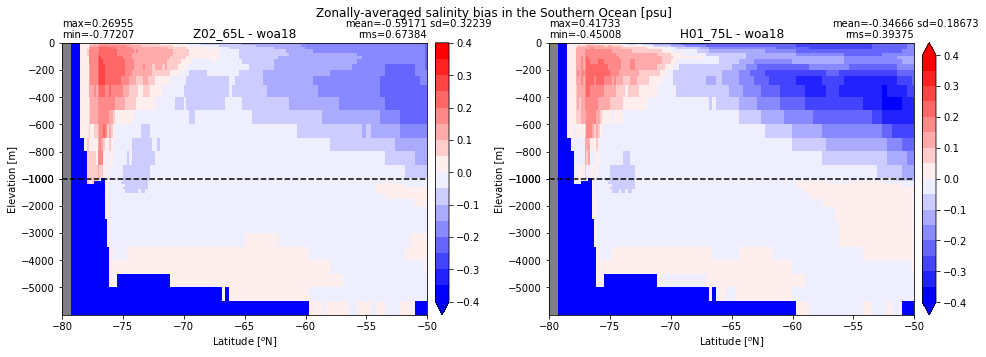

In [46]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged salinity bias in the Southern Ocean [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_so = ((basin_code.sel(region='SouthernOcean')*mom_salt_bias * area_mom3D).sum('xh')/
               (area_mom3D*basin_code.sel(region='SouthernOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_salt_so)).values *0.5
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_salt_so.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-80,-50)

### Indian Ocean

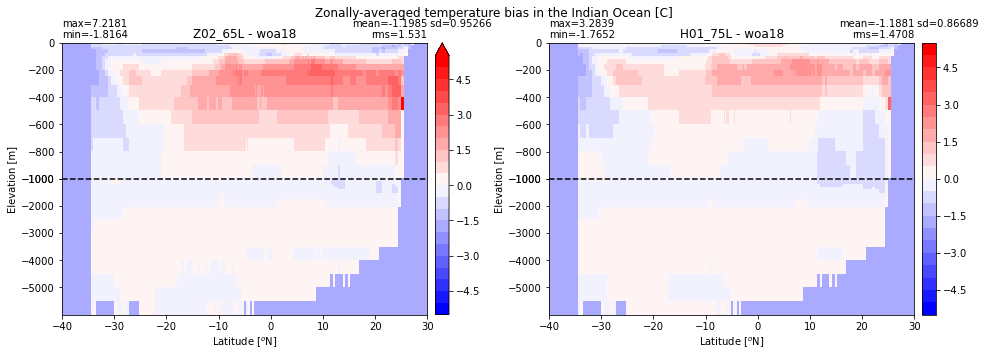

In [47]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged temperature bias in the Indian Ocean [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_io = ((basin_code.sel(region='IndianOcean')*mom_temp_bias * area_mom3D).sum('xh')/
               (area_mom3D*basin_code.sel(region='IndianOcean')).sum('xh'))
   
    if i == 0:
      cmax = np.max(np.abs(mom_temp_io)).values * 0.7
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_temp_io.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-40,30)


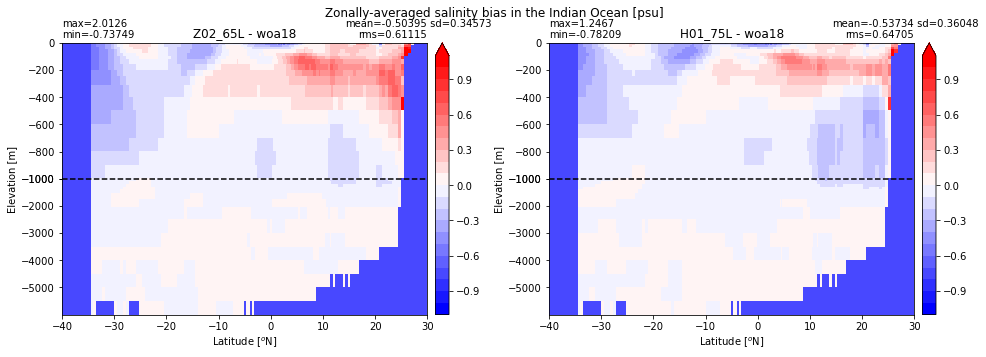

In [48]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged salinity bias in the Indian Ocean [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_io = ((basin_code.sel(region='IndianOcean')*mom_salt_bias * area_mom3D).sum('xh')/
               (area_mom3D*basin_code.sel(region='IndianOcean')).sum('xh'))    
    if i == 0:
      cmax = np.max(np.abs(mom_salt_io)).values *0.5
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_salt_io.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(-40,30)


### Med Sea

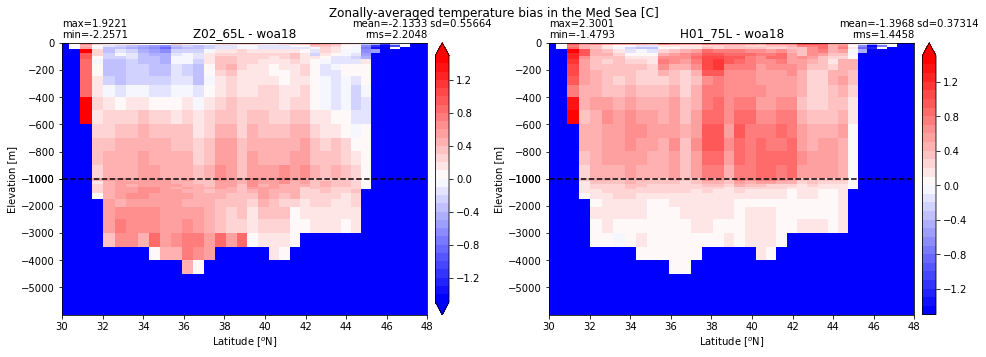

In [49]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged temperature bias in the Med Sea [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_med = ((basin_code.sel(region='MedSea')*mom_temp_bias * area_mom).sum('xh')/
                (area_mom3D*basin_code.sel(region='MedSea')).sum('xh'))
   
    if i == 0:
      #cmax = np.max(np.abs(mom_temp_med)).values * 2
      clim = (-1.5, 1.5)
        
    yzplot(np.ma.masked_invalid(mom_temp_med.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(30,48)


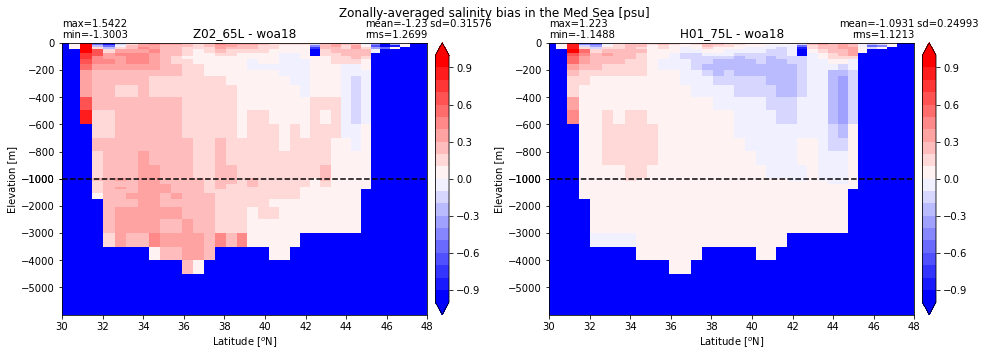

In [50]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged salinity bias in the Med Sea [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_med = ((basin_code.sel(region='MedSea')*mom_salt_bias * area_mom).sum('xh')/
                (area_mom3D*basin_code.sel(region='MedSea')).sum('xh'))    
    if i == 0:
      #cmax = np.max(np.abs(mom_salt_med)).values *0.7
      clim = (-1, 1)
        
    yzplot(np.ma.masked_invalid(mom_salt_med.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(30,48)


### Arctic

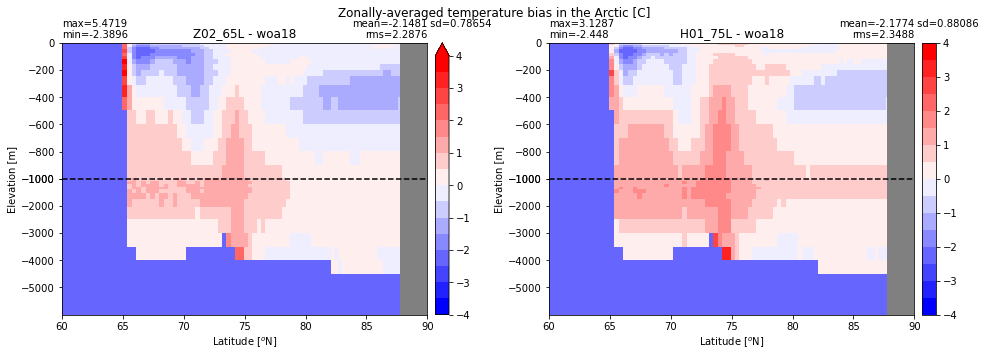

In [51]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged temperature bias in the Arctic [C]')
for i in range(len(exps)):
    ds_mom_t = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_time_mean.nc')
    mom_temp_bias = xr.DataArray((ds_mom_t.thetao.values) - (obs_temp_mom.theta0.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_t.z_l, 'yh': ds_mom_t.yh, 'xh':ds_mom_t.xh})

    mom_temp_arc = ((basin_code.sel(region='Arctic')*mom_temp_bias * area_mom).sum('xh')/
                (area_mom3D*basin_code.sel(region='Arctic')).sum('xh'))
   
    if i == 0:
      cmax = np.max(np.abs(mom_temp_arc)).values * 0.7
      clim = (-cmax, cmax)
        
    yzplot(np.ma.masked_invalid(mom_temp_arc.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(60,90)


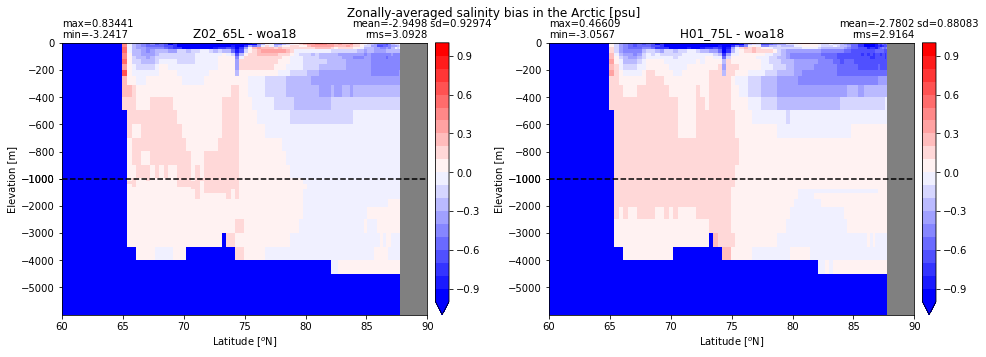

In [52]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,5))
ax1 = ax.flatten()
plt.suptitle('Zonally-averaged salinity bias in the Arctic [psu]')
for i in range(len(exps)):
    ds_mom_s = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_so_time_mean.nc')
    mom_salt_bias = xr.DataArray((ds_mom_s.so.values) - (obs_salt_mom.s_an.values), dims=('z_l', 'yh','xh'), 
                             coords={'z_l':ds_mom_s.z_l, 'yh': ds_mom_s.yh, 'xh':ds_mom_s.xh})

    mom_salt_arc = ((basin_code.sel(region='Arctic')*mom_salt_bias * area_mom).sum('xh')/
                (area_mom3D*basin_code.sel(region='Arctic')).sum('xh'))

    if i == 0:
      cmax = np.max(np.abs(mom_salt_arc)).values 
      clim = (-1, 1)
        
    yzplot(np.ma.masked_invalid(mom_salt_arc.transpose()), ds_mom_t.yh.values, z_mom, ylabel='Latitude', 
           yunits='$^o$N', title=str(labels[i]+' - woa18'), axis=ax1[i], nbins=30, colormap=plt.cm.bwr, 
           clim=clim, centerlabels=True, splitscale=[0, -1000,-6000]); ax1[i].invert_yaxis(); ax1[i].set_xlim(60,90)


## Equatorial plots

### Temperature and Salinity

In [53]:
thislist = []
for i in range(len(exps)):
  thislist.append('../../'+exps[i]+'/PNG/Equatorial/'+exps[i]+'_Equatorial_Global_temperature.png')

dummy = "<img style='width: 450px; margin: 1px; float: left; border: 0px solid black;' src='%s' />"
imagesList=''.join( [dummy % str(s) 
                     for s in thislist ])
display(HTML(imagesList))

In [54]:
thislist = []
for i in range(len(exps)):
  thislist.append('../../'+exps[i]+'/PNG/Equatorial/'+exps[i]+'_Equatorial_Global_salinity.png')

dummy = "<img style='width: 450px; margin: 1px; float: left; border: 0px solid black;' src='%s' />"
imagesList=''.join( [dummy % str(s) 
                     for s in thislist ])
display(HTML(imagesList))

### Undercurrent

In [55]:
thislist = []
for i in range(len(exps)):
  thislist.append('../../'+exps[i]+'/PNG/Equatorial/'+exps[i]+'_Equatorial_Pacific_uo.png')

dummy = "<img style='width: 850px; margin: 1px; float: left; border: 0px solid black;' src='%s' />"
imagesList=''.join( [dummy % str(s) 
                     for s in thislist ])
display(HTML(imagesList))

## Mixing coefficients

In [56]:
def get_data_sf(full_path):
  ds = xr.open_dataset(full_path)
  return ds


In [7]:
start = '0070-01-01'
start = '0089-01-01'
end = '0099-12-31'
def preprocess(ds):
  variables = ['diftrblo', 'difmxylo' ,'difmxybo', 'diftrelo', 'e']
  return ds[variables].sel(time=slice(start, end))

ds1 = []
for i in range(1):
  print(i)
  files = sorted(glob.glob(path+exps[i]+'/run/'+exps[i]+'.mom6.hm_*.nc'))#[0:-1]

  ds = xr.open_mfdataset(files,
        parallel=True,
        concat_dim="time",
        combine="nested",
        preprocess=preprocess,
        chunks={'time': 1},)
    
  ds1.append(ds.mean(dim='time').compute())

0


In [8]:
variables = ['diftrblo', 'difmxylo' ,'difmxybo', 'diftrelo', 'e']

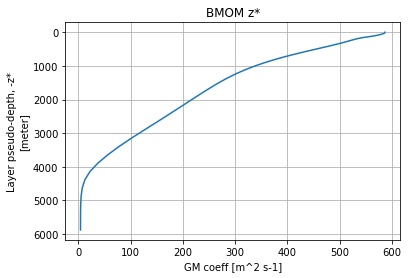

In [11]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ds1[0]['diftrblo'].sel(yh=slice(-65, -55)).mean(dim=['xh','yh']).plot(ax=ax,y="zl")
ax.grid()
ax.set_xlabel('GM coeff [m^2 s-1]')
ax.set_title('BMOM z*')
plt.gca().invert_yaxis()

In [14]:
ds1[0]['diftrelo'].sel(yh=slice(-65, -55)).mean(dim=['xh','yh']).values

array(567.7958, dtype=float32)

In [ ]:
for i in range(1):
  dummy = ds1[i][variables[0]]
  xyplot(np.ma.masked_invalid(dummy), grd.geolon, grd.geolat, area=grd.area_t, 
         clim=(0,1500), title=str(labels[i]))
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,4))
  depth = 0.5 * (ds1[i].e[0:-1,j,i].values + ds1[i].e[1::,j,i].values)
  ax[0].plot(ds1[i][variables[0]][:,j,i].values, depth); ax[0].grid()
  ds1[i][variables[0]][0,:,:].mean('xh').plot(ax=ax[1])

### GM (KHTH)

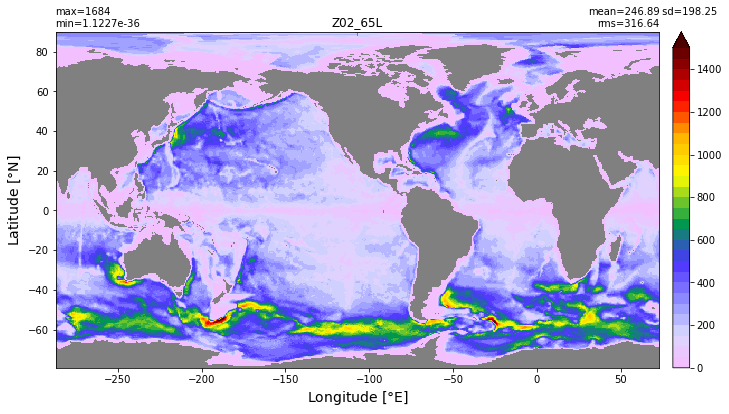

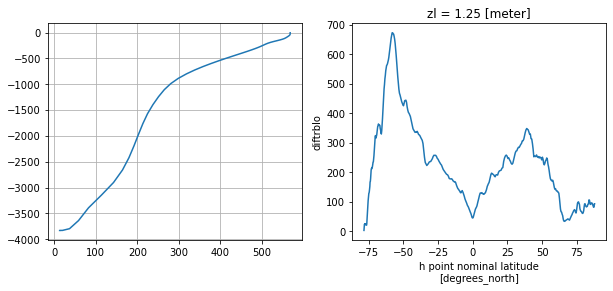

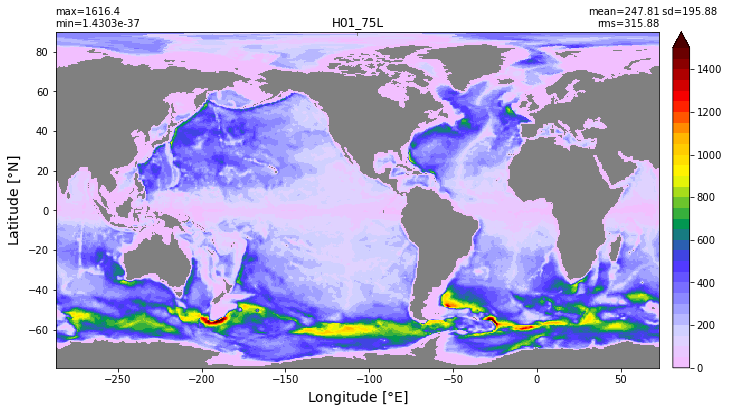

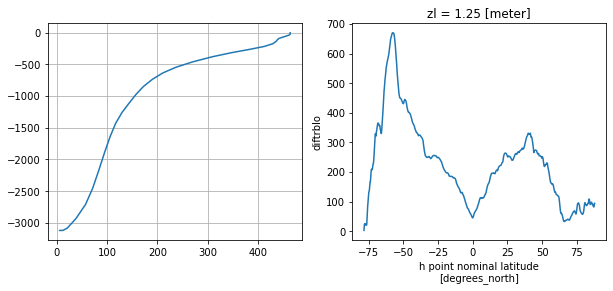

In [29]:
# GM coefficient
# find point in the Drake Passage
j = np.abs( grd.geolat[:,0] - -58.0 ).argmin()
i = np.abs( grd.geolon[0,:] - -58.0 ).argmin()
for i in range(len(exps)):
  dummy = ds1[i][variables[0]][0,:].values
  xyplot(np.ma.masked_invalid(dummy), grd.geolon, grd.geolat, area=grd.area_t, 
         clim=(0,1500), title=str(labels[i]))
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,4))
  depth = 0.5 * (ds1[i].e[0:-1,j,i].values + ds1[i].e[1::,j,i].values)
  ax[0].plot(ds1[i][variables[0]][:,j,i].values, depth); ax[0].grid()
  ds1[i][variables[0]][0,:,:].mean('xh').plot(ax=ax[1])

### Laplacian viscosity

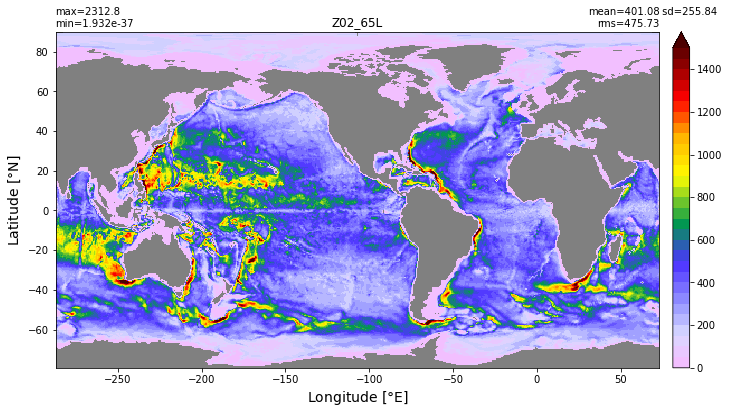

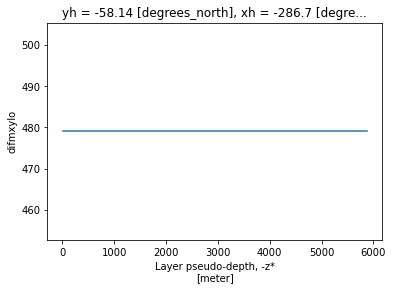

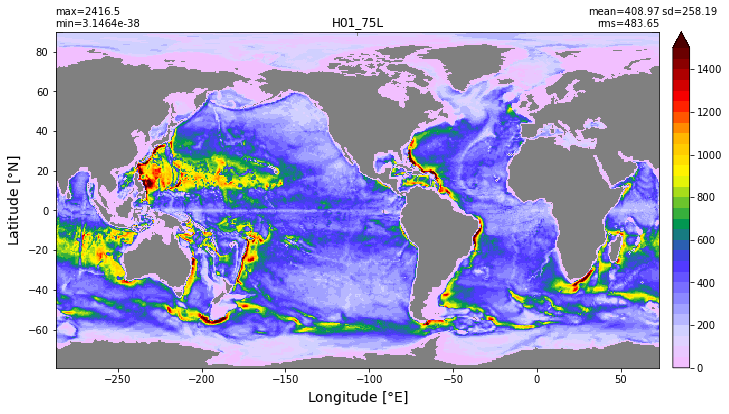

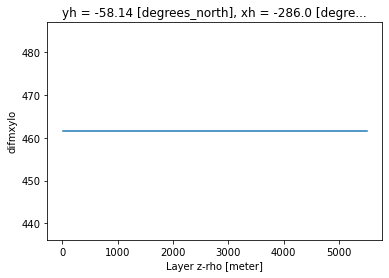

In [30]:
# Laplacian visc
# find point in the Drake Passage
j = np.abs( grd.geolat[:,0] - -58.0 ).argmin()
i = np.abs( grd.geolon[0,:] - -58.0 ).argmin()
for i in range(len(exps)):
  dummy = ds1[i][variables[1]][0,:].values
  xyplot(np.ma.masked_invalid(dummy), grd.geolon, grd.geolat, 
         area=grd.area_t, clim=(0,1500), title=str(labels[i]))
  f, ax = plt.subplots(1,1)
  ds1[i][variables[1]][:,j,i].plot(ax=ax)

### Biharmonic viscosity

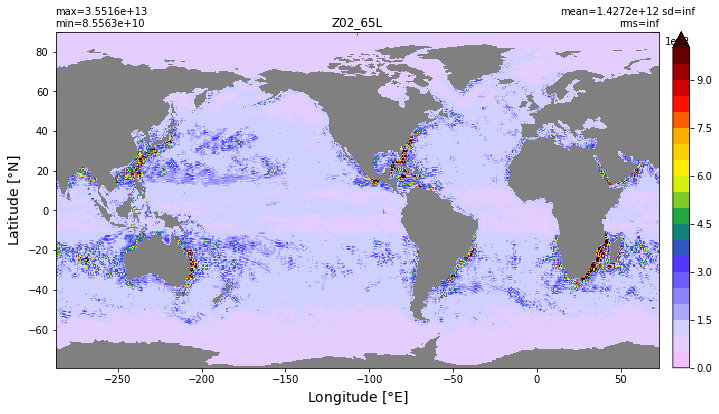

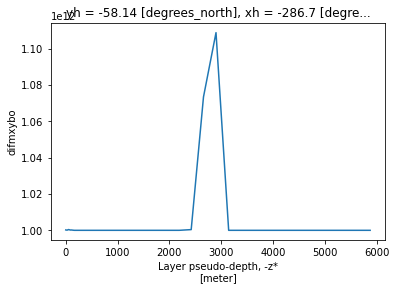

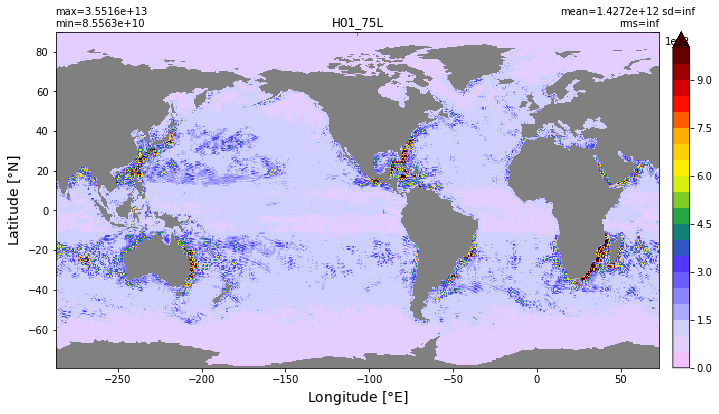

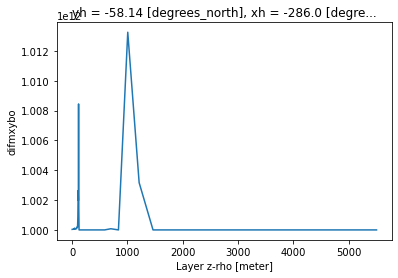

In [31]:
# Biharmonic
# find point in the Drake Passage
j = np.abs( grd.geolat[:,0] - -58.0 ).argmin()
i = np.abs( grd.geolon[0,:] - -58.0 ).argmin()
for i in range(len(exps)):
  dummy = ds1[i][variables[2]][0,:].values
  xyplot(np.ma.masked_invalid(ds[variables[2]][0,0,:].values), grd.geolon, 
         grd.geolat, area=grd.area_t, clim=(1.0e11,1.0e13), title=str(labels[i]))
  f, ax = plt.subplots(1,1)
  #ds1[i][variables[2]][:,j,i].plot(ax=ax)

### Redi (KHTR)

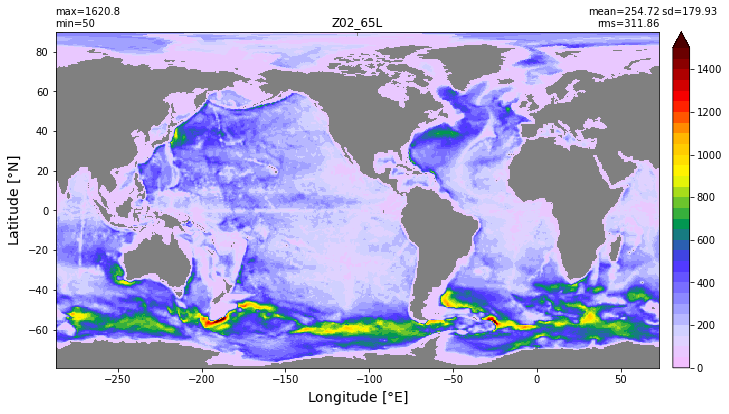

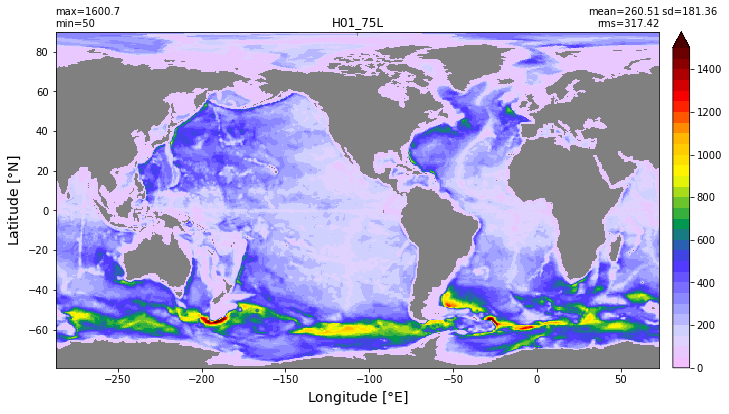

In [34]:
# KHTR (Redi)
# find point in the Drake Passage
j = np.abs( grd.geolat[:,0] - -58.0 ).argmin()
i = np.abs( grd.geolon[0,:] - -58.0 ).argmin()
for i in range(len(exps)):
  dummy = ds1[i][variables[3]][:].values
  xyplot(np.ma.masked_invalid(dummy), grd.geolon, grd.geolat, 
         clim=(0, 1500), area=grd.area_t, title=str(labels[i]))

In [37]:
client.close()

## Score cards (experimental)

In [63]:
def score_plot(x,y,vals, cmin=None, cmax=None, cmap=plt.cm.bwr,title='',nbins=50, units=''):
  import matplotlib
  matplotlib.rcParams.update({'font.size': 14})
  reg = np.arange(len(x)+ 1)
  autocenter=False
  if not cmin:
    cmin = vals.min().values
    #autocenter=True
  if not cmax:
    cmax = vals.max().values
    
  #print(cmin, autocenter)
  cmap, norm, extend = chooseColorLevels(cmin, cmax, cmap,
                                         nbins=nbins, autocenter=autocenter)
  #print(val_abs)
  fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(8,5), sharex=True)
  ax[0].set_title(title)
  # 0 to 200 depth[0] to depth[9]
  cs = ax[1].pcolormesh(reg, y, vals.transpose().values, cmap=cmap, norm=norm)
  ax[1].set_xticks(np.arange(len(x))+0.5)
  ax[1].set_xticklabels(x);
  ax[1].set_ylim(0,200)
  ax[1].set_ylabel('Depth [m]')
  # 200 to 1000
  cs = ax[0].pcolormesh(reg, y, vals.transpose().values, cmap=cmap, norm=norm)
  ax[0].set_xticks(np.arange(len(x))+0.5)
  ax[0].set_xticklabels(x);
  ax[0].set_ylim(200,1000)
  ax[0].set_ylabel('Depth [m]')

  # Rotate the tick labels and set their alignment.
  plt.setp(ax[1].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
  fig.subplots_adjust(right=0.8)
  cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
  cbar = fig.colorbar(cs, cax=cbar_ax)
  cbar.set_label(units)

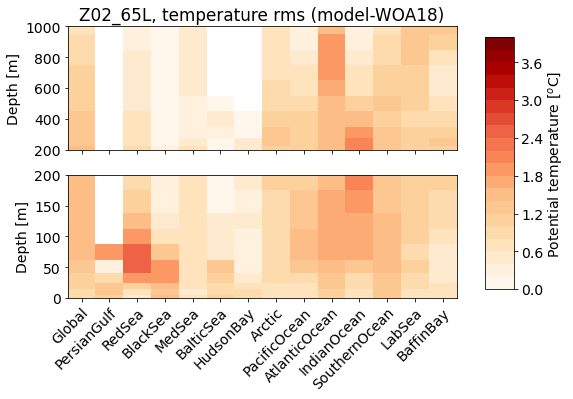

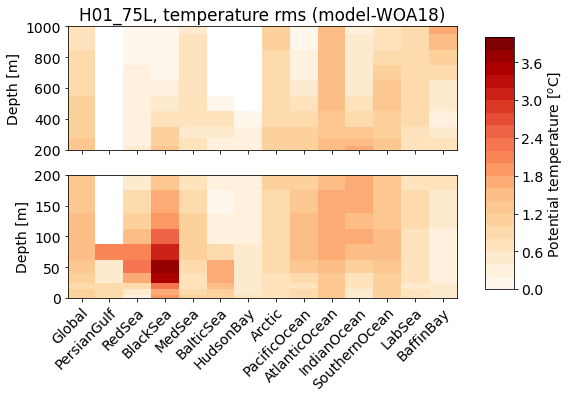

In [64]:
for i in range(len(exps)):
  ds = xr.open_dataset('../../'+exps[i]+'/ncfiles/'+exps[i]+'_thetao_bias_ann_mean_stats.nc') 
  if i == 0:
    depth = ds.depth.values
    basin = ds.basin.values
    interfaces = np.zeros(len(depth)+1)
    for k in range(1,len(depth)+1):
      interfaces[k] = interfaces[k-1] + ( 2 * (depth[k-1] - interfaces[k-1]))

    reg = np.arange(len(ds.basin.values)+ 1)

  temp_label = r'Potential temperature [$^o$C]'
  # rms
  score_plot(basin, interfaces, ds.thetao_bias_stats[:,4,:],nbins=30, 
            units=temp_label, cmin=0., cmax=4, cmap=plt.cm.OrRd,
            title=labels[i]+', temperature rms (model-WOA18)')
    